In [1]:
import matplotlib.pyplot as plt
import os
import math
import numpy as np
import pandas as pd
import re

import time
import torch
import torch.nn

import random
import pickle

# import self-defined module
from utils_eval import AverageMeter

In [2]:
if torch.cuda.is_available():
    print(torch.cuda.current_device())
    print(torch.cuda.device(0))
    print(torch.cuda.device_count())
    print(torch.cuda.get_device_name(0))
else:
    print('CUDA is not available.')

0
1
NVIDIA A100-PCIE-40GB


In [3]:
import torch.backends.cudnn as cudnn
if torch.cuda.is_available():
    device = torch.device("cuda:0")
    # work on a single GPU or CPU
    cudnn.benchmark=True
else:
    device = torch.device("cpu")
    cudnn.benchmark=False

print(device)
print(torch.cuda.get_device_name(0))

cuda:0
NVIDIA A100-PCIE-40GB


In [4]:
import matplotlib
matplotlib.rcParams['pdf.fonttype'] = 42
matplotlib.rcParams['ps.fonttype'] = 42

# 1. Load data

### a. Microbiome

In [5]:
microbiome_df = pd.read_csv('../data/combined.genus_abundance.with_archaea_bacteria_only.clr.transformed.csv', index_col=0)

In [6]:
GENERATE_METADATA = False

In [7]:
if GENERATE_METADATA:
    import requests
    import pandas as pd

    # List of file UUIDs
    file_uuids = microbiome_df.index

    # Initialize an empty list to store data
    metadata_list = []

    # Base URL for the GDC API
    base_url = "https://api.gdc.cancer.gov/files/"
    params = {
        "expand": "cases.samples,annotations",
    }

    # Loop through each file UUID
    for i, file_uuid in enumerate(file_uuids[414:]):
        print(i, file_uuid)
        # Fetch metadata for the file
        url = f"{base_url}{file_uuid}"
        response = requests.get(url, params=params)
        metadata = response.json()
        
        # Extract the required information
        experimental_strategy = metadata['data']['experimental_strategy']
        
        # Iterate over the samples associated with the file
        for case in metadata['data'].get('cases', []):
            for sample in case.get('samples', []):
                submitter_id = sample['submitter_id']
                sample_id = sample['sample_id']
                sample_type = sample['sample_type']
                
                # Append a row to the data list
                metadata_list.append({
                    "file_uuid": file_uuid,
                    "submitter_id": submitter_id,
                    "sample_id": sample_id,
                    "sample_type": sample_type,
                    "experimental_strategy": experimental_strategy
                })

    # Create a pandas DataFrame
    metadata_df = pd.DataFrame(metadata_list)
    metadata_df.to_csv('../data/metadata_df.csv', index=False)
else:
    metadata_df = pd.read_csv('../data/metadata_df.csv')


In [8]:
microbiome_metadata_df = pd.merge(left=microbiome_df, right=metadata_df, how='left', left_index=True, right_on='file_uuid')

# only keep the first row for each TCGA barcode
microbiome_metadata_df['barcode_base'] = microbiome_metadata_df['submitter_id'].str[:-1]
microbiome_metadata_df = microbiome_metadata_df.sort_values('submitter_id', ascending=True).drop_duplicates(subset='barcode_base', keep='first')
microbiome_metadata_df = microbiome_metadata_df.drop(columns=['submitter_id'])

### b. Immune variables

In [9]:
### Read clinical varaible data
clinical_immune_variables_df = pd.read_excel('../data/Master Table-Alteration in CNV, Mut, Pathway .xlsx', sheet_name='Clinical variables', 
                                             header=0, index_col=1, 
                                             na_values=['[Not Applicable]', '#N/A', '[Not Available]', 
                                                        '[Discrepancy]', '[Not Evaluated]', '[Unknown]'])

# Remove duplicate columns
import re
for c in clinical_immune_variables_df.columns:
    if re.search('.*[.]\d', c):
        clinical_immune_variables_df = clinical_immune_variables_df.drop(columns = [c])
clinical_immune_variables_df = clinical_immune_variables_df.drop(columns = ['OS Time', 'OS.time (months)', 'OS', 
                                                                            'PFI Time', 'DSS.time (days)'])

# Pick out immune variables
imune_check_df = pd.read_csv('../data/immune_check_df.csv', header=0, index_col=0)
immune_variables_names = imune_check_df['features'].loc[imune_check_df['immune feature (1/0)'] == 1].values
immune_variables_df = clinical_immune_variables_df.loc[:, immune_variables_names]
immune_variables_df = pd.concat([clinical_immune_variables_df[['PATIENT_BARCODE', 'DISEASE']], 
                                 immune_variables_df], axis=1)

In [10]:
immune_variables_df

,PATIENT_BARCODE,DISEASE,HLA-A1,HLA-A2,homo HLA-A =1,HLA-B1,HLA-B2,homo HLA-B =1,HLA-C1,HLA-C2,...,T Cells CD4 Memory Resting,T Cells CD4 Naive,T Cells CD8,T Cells Follicular Helper,T Cells gamma delta,T Cells Regulatory Tregs,Lymphocytes,Mast Cells,Dendritic Cells,Macrophages
SAMPLE_BARCODE,,,,,,,,,,,,,,,,,,,,,
TCGA-OR-A5J1-01,TCGA-OR-A5J1,ACC,hla_a_03_01_01_01,hla_a_02_01_01_01,0.0,hla_b_07_02_01,hla_b_35_01_01_02,0.0,hla_c_12_03_01_01,hla_c_04_01_01_01,...,0.271379,0.000000,0.135295,0.000550,0.0,0.000000,0.504445,0.113973,0.020279,0.361304
TCGA-OR-A5J2-01,TCGA-OR-A5J2,ACC,hla_a_03_01_01_01,hla_a_33_01_01,0.0,hla_b_14_02_01,hla_b_08_01_01,0.0,hla_c_07_01_01_01,hla_c_08_02_01,...,0.138389,0.000000,0.113243,0.010731,0.0,0.000000,0.442393,0.000000,0.049605,0.508002
TCGA-OR-A5J3-01,TCGA-OR-A5J3,ACC,hla_a_23_01_01,hla_a_31_01_02,0.0,hla_b_55_01_01,hla_b_15_05_01,0.0,hla_c_01_02_01,hla_c_01_02_01,...,0.110013,0.143165,0.017344,0.000000,0.0,0.000000,0.456039,0.084546,0.156533,0.302882
TCGA-OR-A5J5-01,TCGA-OR-A5J5,ACC,hla_a_24_02_01_01,hla_a_23_01_01,0.0,hla_b_35_01_01_02,hla_b_40_01_02,0.0,hla_c_03_04_01_01,hla_c_04_01_01_01,...,0.165923,0.009546,0.061211,0.000000,0.0,0.000000,0.409311,0.028120,0.018774,0.543795
TCGA-OR-A5J6-01,TCGA-OR-A5J6,ACC,hla_a_03_01_01_01,hla_a_33_01_01,0.0,hla_b_14_02_01,hla_b_15_10_01,0.0,hla_c_08_02_01,hla_c_03_04_02,...,0.134203,0.000000,0.053699,0.001461,0.0,0.000000,0.218803,0.096331,0.015021,0.666090
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TCGA-YZ-A980-01,TCGA-YZ-A980,UVM,hla_a_24_02_01_01,hla_a_23_01_01,0.0,hla_b_07_02_01,hla_b_18_01_01_01,0.0,hla_c_07_02_01_03,hla_c_05_01_01_01,...,0.011387,0.000000,0.131042,0.109982,0.0,0.003538,0.349903,0.048025,0.000000,0.602072
TCGA-YZ-A982-01,TCGA-YZ-A982,UVM,hla_a_03_01_01_01,hla_a_01_01_01_01,0.0,hla_b_51_01_01,hla_b_44_02_01_01,0.0,hla_c_15_02_01,hla_c_05_01_01_02,...,0.069677,0.000000,0.020880,0.025424,0.0,0.024915,0.260535,0.132749,0.002590,0.604126
TCGA-YZ-A983-01,TCGA-YZ-A983,UVM,hla_a_11_01_01,hla_a_24_02_01_01,0.0,hla_b_18_03,hla_b_35_01_01_02,0.0,hla_c_07_01_01_01,hla_c_04_01_01_05,...,0.063108,0.000000,0.030245,0.000578,0.0,0.001941,0.313487,0.295331,0.003421,0.387761


# 2. Process and merge data

In [11]:
def remove_missing_rows(dataset, microbiome_column_index):
    start_idx = microbiome_column_index[0]
    end_idx = microbiome_column_index[1]
    
    na_idx = np.where(pd.isna(dataset.iloc[:,start_idx:end_idx]).sum(axis=1)==(end_idx-start_idx))[0]
    dataset_nona = dataset.drop(dataset.index[na_idx], axis=0)
    return dataset_nona

In [12]:
def subsetting(dataset, columns, remain_value_list):
    for column, remain_value in zip(columns, remain_value_list):
        idx_remain = np.isin(dataset.loc[:, column], remain_value)
        dataset = dataset.loc[idx_remain, :]
    return dataset

In [13]:
def merge_immune_microbiome(disease, immune_variables_df, microbiome_metadata_df, 
                              subsetting_columns=['sample_type', 'experimental_strategy'], 
                              remain_value_list=[['Primary Tumor'], ['RNA-Seq']]):
    
    
    ### Read immune data
    immune_variables_df_disease = immune_variables_df.loc[immune_variables_df['DISEASE'] == disease,:]
    import re
    na_col_idx = np.where([re.search('Unnamed.*', immune_variables_df_disease.columns[i]) 
                          for i in range(immune_variables_df_disease.shape[1])])
    rm_col_name = ['type','order in TCGA immune data table', 'patientBarcode', 'bcr_patient_barcode',
                  'barcode', 'TCGA Participant Barcode', 'TCGA Study']
    rm_col_name = list(set(rm_col_name) & set(immune_variables_df_disease.columns))

    immune_variables_df_disease = immune_variables_df_disease.\
        drop(columns=list(immune_variables_df_disease.columns[na_col_idx]) + rm_col_name)
    
    print('========================================================================')
    print(disease.upper())
    print('< immune Variables >')
    print('Total sample #:', immune_variables_df_disease.shape[0])
    print('Unique patient #:', len(np.unique(immune_variables_df_disease['PATIENT_BARCODE'])))

    immune_variables_df_disease_microbiome = pd.merge(left=immune_variables_df_disease, right=microbiome_metadata_df, 
                                                        how='left', left_index=True, right_on='barcode_base')
    immune_variables_df_disease_microbiome.set_index('barcode_base', inplace=True)

    ### Remove rows with no corresponding microbiome data
    microbiome_column_index = [immune_variables_df_disease.shape[1], 
                            immune_variables_df_disease_microbiome.shape[1]-4] # 1778 columns in total for microbiome data
    immune_variables_df_disease_microbiome_nona = remove_missing_rows(immune_variables_df_disease_microbiome, 
                                                                        microbiome_column_index)
    immune_variables_df_disease_microbiome_clean = subsetting(immune_variables_df_disease_microbiome_nona, 
                                                    subsetting_columns, remain_value_list)
    microbiome_clean = immune_variables_df_disease_microbiome_clean.iloc[:, microbiome_column_index[0]:microbiome_column_index[1]]

    print('< Merged data >')
    print('Merged data shape:', immune_variables_df_disease_microbiome_clean.shape)
    print('Microbiome data shape:', microbiome_clean.shape)
    print('sample_type:', list(np.unique(immune_variables_df_disease_microbiome_clean['sample_type'])))
    
    ### Saving data
    import os
    os.makedirs('./data/processed data', exist_ok=True)
    immune_variables_df_disease_microbiome_clean.\
        to_pickle('./data/processed data/{}_immune_variables_disease_microbiome_clean.pkl'.format(disease))
    microbiome_clean.\
        to_pickle('./data/processed data/{}_microbiome_clean.pkl'.format(disease))

    return immune_variables_df_disease_microbiome_clean, microbiome_clean


In [14]:
COAD_immune_variables_disease_microbiome_clean, COAD_microbiome_clean = \
    merge_immune_microbiome(disease='COAD', immune_variables_df=immune_variables_df,
                              microbiome_metadata_df=microbiome_metadata_df,
                              remain_value_list=[['Metastatic', 'Primary Tumor', 'Recurrent Tumor'], ['RNA-Seq']])
STAD_immune_variables_disease_microbiome_clean, STAD_microbiome_clean = \
    merge_immune_microbiome(disease='STAD', immune_variables_df=immune_variables_df,
                              microbiome_metadata_df=microbiome_metadata_df,
                              remain_value_list=[['Primary Tumor'], ['RNA-Seq']])

COAD
< immune Variables >
Total sample #: 341
Unique patient #: 341
< Merged data >
Merged data shape: (246, 1839)
Microbiome data shape: (246, 1778)
sample_type: ['Primary Tumor']
STAD
< immune Variables >
Total sample #: 383
Unique patient #: 383
< Merged data >
Merged data shape: (380, 1839)
Microbiome data shape: (380, 1778)
sample_type: ['Primary Tumor']


In [15]:
LUAD_clinical_variables_disease_microbiome_clean, LUAD_microbiome_clean = \
    merge_immune_microbiome(disease='LUAD', immune_variables_df=immune_variables_df,
                              microbiome_metadata_df=microbiome_metadata_df,
                              remain_value_list=[['Primary Tumor', 'Recurrent Tumor'], ['RNA-Seq']])
LUSC_clinical_variables_disease_microbiome_clean, LUSC_microbiome_clean = \
    merge_immune_microbiome(disease='LUSC', immune_variables_df=immune_variables_df,
                              microbiome_metadata_df=microbiome_metadata_df,
                              remain_value_list=[['Primary Tumor'], ['RNA-Seq']])

LUAD
< immune Variables >
Total sample #: 502
Unique patient #: 502
< Merged data >
Merged data shape: (502, 1839)
Microbiome data shape: (502, 1778)
sample_type: ['Primary Tumor']
LUSC
< immune Variables >
Total sample #: 464
Unique patient #: 464
< Merged data >
Merged data shape: (464, 1839)
Microbiome data shape: (464, 1778)
sample_type: ['Primary Tumor']


# 3. Prediction by MLPs

In [16]:
### remove nan values
def remove_nan(y):
    nan_idx = np.where(pd.isna(y))[0]
    return y.drop(y.index[nan_idx], axis=0)

In [17]:
### Discretize the continuous variables into 2 or 3 categories - low, (moderate), high
def if_discretize(y_nonan):
    if y_nonan.dtype.name == 'object':
        y_disc = y_nonan
    elif len(np.unique(y_nonan)) <= 6:
        y_disc = y_nonan
    elif np.quantile(y_nonan, 1/2)==np.min(y_nonan):
        y_disc = pd.Series(np.where(y_nonan==np.min(y_nonan), 'Min', 'Not Min'), index=y_nonan.index)
    elif np.quantile(y_nonan, 1/2)==np.max(y_nonan):
        y_disc = pd.Series(np.where(y_nonan==np.max(y_nonan), 'Not Max', 'Max'), index=y_nonan.index)
    elif np.quantile(y_nonan, 1/3)==np.min(y_nonan) or np.quantile(y_nonan, 2/3)==np.max(y_nonan):
        y_disc = pd.qcut(y_nonan, 2, labels=['Low', 'High'])
    else:
        y_disc = pd.qcut(y_nonan, 3, labels=['Low', 'Moderate', 'High'])
    
    ### remove categories with less than 5 instances (8/2 training/testing split)
    u, c = np.unique(y_disc, return_counts=True)
    idx = np.where(np.isin(y_disc, u[c<5]))
    return y_disc.drop(index=y_disc.index[idx])

In [18]:
def balanced_over_sampling(X, y, random_seed=123):
    np.random.seed(random_seed)
    unique_value, unique_value_counts = np.unique(y, return_counts=True)
    train_class_max = np.max(unique_value_counts)
    train_samples_idx = []
    for i, y_unique in enumerate(unique_value):
        train_one_class_idx = np.where(y==y_unique)[0]
        train_one_sample_idx = np.concatenate([train_one_class_idx,
                                               np.random.choice(train_one_class_idx, 
                                                                size=train_class_max-len(train_one_class_idx), replace=True)])
        train_samples_idx.append(train_one_sample_idx)
    train_balanced_idx = np.random.permutation(np.concatenate(train_samples_idx))
    return X[train_balanced_idx], y[train_balanced_idx]

In [19]:
class Classifier(torch.nn.Module):
    def __init__(self, n_in_features, net_hidden_structure, n_out_features, dropout_rate):
        super(Classifier, self).__init__()
        net_fcs = []
        structure = net_hidden_structure
        net_in_shape = n_in_features
        for i, net_n_hidden_nodes in enumerate(structure):
            net_fcs.append(torch.nn.Linear(net_in_shape, net_n_hidden_nodes))
            net_fcs.append(torch.nn.BatchNorm1d(net_n_hidden_nodes))
            net_fcs.append(torch.nn.ReLU6())
            net_fcs.append(torch.nn.Dropout(p=dropout_rate))
            net_in_shape = net_n_hidden_nodes
        net_fcs.append(torch.nn.Linear(net_in_shape, n_out_features))
        self.net_fcs = torch.nn.ModuleList(net_fcs)
        
    def forward(self, x):
        net_fcs = self.net_fcs
        for net_fc in net_fcs:
            x = net_fc(x)
        return x

In [20]:
from torch.utils.data import Dataset, DataLoader
class Dataset(Dataset):
    """Self-defined dataset."""

    def __init__(self, X, y):
        """
        Args:
            X: microbiome data
            y: response data
        """
        self.X = torch.from_numpy(X).float() if not torch.is_tensor(X) else X.float()
        self.y = torch.LongTensor(y) if not torch.is_tensor(y) else y.long()

    def __len__(self):
        return len(self.X)

    def __getitem__(self, idx):
        return self.X[idx], self.y[idx]

In [21]:
# train function
from utils_eval import AverageMeter

def train(epoch, classifier, criterion, optimizer, train_loader, gradient_clip=3, device='cpu'):
    """
    One epoch training
    """
    
    classifier.train()
    losses = AverageMeter()
    
    for batch_idx, (data, target) in enumerate(train_loader):
        batch_size = data.size(0)
        data, target = data.to(device), target.to(device)
        optimizer.zero_grad()

        # ===================forward=====================
        outputs = classifier(data)
        loss = criterion(outputs, target)

        # ===================backward=====================
        loss.backward()
        torch.nn.utils.clip_grad_norm_(classifier.parameters(), gradient_clip)
        optimizer.step()
        
        # ===================meters=====================
        losses.update(loss.item(), batch_size)
        loss_return = losses.avg
    
    return loss_return

In [22]:
def train_mlp(X,y, disease, batch_size, n_epoch, gradient_clip, dropout_rate, weight_decay,
              lr=0.001, momentum=0.9, random_state=123, device='cuda:0', print_loss=True,
              save_folder='./'):
    
    import torch
    import torch.nn as nn
    import random
    torch.manual_seed(random_state)
    np.random.seed(random_state)
    random.seed(random_state)
    #torch.set_deterministic(True)
    if torch.cuda.is_available():
        torch.cuda.manual_seed_all(random_state)
        
    ###
    y_nonan = remove_nan(y)
    y_nonan_disc = if_discretize(y_nonan)
    X_nonan = X.loc[y_nonan_disc.index,:]
    
    ### training, testing split
    from sklearn.model_selection import train_test_split

    X_train, X_test, y_train, y_test = train_test_split(X_nonan, y_nonan_disc, test_size=0.2, 
                                                        random_state=random_state, stratify=y_nonan_disc)
    X_train_balanced, y_train_balanced = balanced_over_sampling(np.array(X_train), np.array(y_train))

    from sklearn.preprocessing import LabelEncoder
    le = LabelEncoder()
    le.fit(y_nonan_disc)
    y_train_balanced_le = le.transform(y_train_balanced)
    y_test_le = le.transform(y_test)
    classes = le.classes_
    label_dim = len(classes)

    # train_data = torch.utils.data.TensorDataset(torch.tensor(np.array(X_train, dtype='float32')), torch.LongTensor(y_train_le))
    # test_data = torch.utils.data.TensorDataset(torch.tensor(np.array(X_test, dtype='float32')), torch.LongTensor(y_test_le))

    train_data = Dataset(np.array(X_train_balanced), np.array(y_train_balanced_le))
    test_data = Dataset(np.array(X_test), np.array(y_test_le))
    if X_train_balanced.shape[0]%batch_size==1:
        train_loader = torch.utils.data.DataLoader(train_data, batch_size=batch_size, shuffle=True, num_workers=0, drop_last=True)
    else:
        train_loader = torch.utils.data.DataLoader(train_data, batch_size=batch_size, shuffle=True, num_workers=0)
    test_loader = torch.utils.data.DataLoader(test_data, batch_size=batch_size, shuffle=False, num_workers=0)

    classifier = Classifier(n_in_features=X.shape[1], net_hidden_structure = [512, 128, 32, 8], 
                            n_out_features=label_dim, dropout_rate=dropout_rate)
    classifier.to(device)
    criterion = nn.CrossEntropyLoss() # nn.CrossEntropyLoss combines log_softmax and NLLLoss
    optimizer = torch.optim.SGD(classifier.parameters(), lr=lr, momentum=momentum, weight_decay = weight_decay)
    
    # =========================
    from utils_eval import AverageMeter
    
    hist = dict()
    hist['train_loss'] = []
    hist['test_loss'] = []

    for epoch in range(n_epoch):
        # Train
        train_loss = train(epoch, classifier, criterion, optimizer, train_loader, gradient_clip=gradient_clip, 
                           device=device)
        hist['train_loss'].append(train_loss)

        # test
        classifier.eval()
        test_losses = AverageMeter()

        with torch.no_grad():
            for idx, (data, target) in enumerate(test_loader):
                batch_size = data.size(0)
                data, target = data.to(device), target.to(device)

                # ===================forward=====================
                outputs = classifier(data)
                test_loss = criterion(outputs, target)
                # ===================meters======================
                test_losses.update(test_loss.item(), batch_size)

            hist['test_loss'].append(test_losses.avg)
        if print_loss:
            print('Epoch {} \ttrain_loss\t{}\ttest_loss\t{}'.format(epoch, train_loss, test_losses.avg))
    
    model_save_path = os.path.join(save_folder, 'models/{}/{}'.format(disease, y.name))
    os.makedirs(model_save_path, exist_ok=True)

    torch.save({
                'epoch': n_epoch,
                'model_state_dict': classifier.state_dict(),
                'optimizer_state_dict': optimizer.state_dict(),
                'history': hist
                }, os.path.join(model_save_path, '{}.pth'.format(y_train.name)))
    return classifier, optimizer, hist, X_test, y_test_le, classes, (y_train, y_test)

In [23]:
def plot_loss(hist, disease, y, save_folder='./'):
    
    fig = plt.figure(figsize=(16,8))

    plt.plot(np.arange(len(hist['train_loss'])), hist['train_loss'], 
                 label='Training loss', alpha=0.8)

    plt.plot(np.arange(len(hist['test_loss'])), hist['test_loss'], 
                 label='Testing loss', alpha=0.8)

    plt.xlabel('Epoches', fontsize=20)
    plt.xticks(fontsize=20)
    plt.ylabel('Loss', fontsize=20)
    plt.yticks(fontsize=20)
    plt.title('Loss (Covariate = {})'.format(y.name), fontsize=20)
    plt.legend(fontsize=20)
    plt.show()
    
    figure_save_path = os.path.join(save_folder, 'figures/{}/{}'.format(disease, y.name))
    os.makedirs(figure_save_path, exist_ok=True)
    fig.savefig(os.path.join('./figures/{}/{}/train_val_losses.pdf'.format(disease, y.name)))

In [24]:
def micro_avg_auc(y_test_le, classes, pred_proba):
    from sklearn.metrics import roc_curve, auc
    from sklearn.preprocessing import label_binarize
    
    y_test = label_binarize(classes[y_test_le], classes=classes)
    if y_test.shape[1]==1:
        y_test = np.hstack((1-y_test, y_test))
    y_score = pred_proba.cpu().numpy()
    
    # Compute micro-average ROC curve and ROC area
    fpr, tpr, _ = roc_curve(y_test.ravel(), y_score.ravel())
    roc_auc = auc(fpr, tpr)
    
    return roc_auc

In [25]:
def predict_mlp(classifier, optimizer, X_test, y_test_le, classes, device='cpu'):
    classifier.eval()
    with torch.no_grad():
        prediction = classifier(torch.tensor(np.array(X_test, dtype='float32')).to(device))
        pred_proba = torch.nn.Softmax(dim=1)(prediction)
    y_pred = classes[pred_proba.argmax(axis=1).cpu().numpy()]
    y_test_true = classes[y_test_le]
    
    accuracy = sum(y_pred==y_test_true)/len(y_pred)
    
    from sklearn.metrics import confusion_matrix
    confusion_mat = confusion_matrix(y_test_true, y_pred)
    
    auc_micro_avg = micro_avg_auc(y_test_le, classes, pred_proba)
    
    from sklearn.metrics import roc_auc_score
    y_pred_proba = pred_proba[:,1].cpu().numpy() if pred_proba.shape[1]==2 else pred_proba.cpu().numpy()
    auc_weighted_avg = roc_auc_score(y_test_true, y_pred_proba, multi_class='ovr', average="weighted")
    
    return pred_proba, y_pred, accuracy, confusion_mat, (auc_micro_avg, auc_weighted_avg)
    

In [26]:
def train_mlp_all_cols(disease, nan_percentage_cutoff=0.4, device='cuda:0', save_folder='./', dropout_rate=0., weight_decay=0.):
    immune_variables_disease_microbiome_clean = \
        pd.read_pickle('./data/processed data/{}_immune_variables_disease_microbiome_clean.pkl'.format(disease))

    X_microbiome = pd.read_pickle('./data/processed data/{}_microbiome_clean.pkl'.format(disease))
    col_idx = immune_variables_disease_microbiome_clean.shape[1] - X_microbiome.shape[1] - 4
    y_immune_all = immune_variables_disease_microbiome_clean.iloc[:, 2:col_idx]

    ### Remove columns that have >40% (or a preset value) nan values for all samples
    y_immune_all_rmv_idx = np.where(y_immune_all.\
                          apply(lambda x: sum(pd.isna(x))/len(x), axis=0) > nan_percentage_cutoff)[0]
    y_immune_all.drop(columns=y_immune_all.columns[y_immune_all_rmv_idx], inplace=True)

    ### Remove columns with a single response after discretization
    y_1value_idx = y_immune_all.apply(lambda x: len(np.unique(if_discretize(remove_nan(x)))), axis=0)==1
    y_immune_all.drop(columns=y_immune_all.columns[y_1value_idx], inplace=True)
        
    ### Remove columns with < 5 instances after discretization
    y_less5_ins_idx = y_immune_all.apply(lambda y: if_discretize(remove_nan(y)).shape[0] < 5, axis=0)
    y_immune_all.drop(columns=y_immune_all.columns[y_less5_ins_idx], inplace=True)

    accuracy_immune_variables = []
    auc_immune_variables = []
    y_pred_immune_variables = []
    confusion_mat_immune_variables = []
    pred_proba_immune_variables = []
    classes_immune_variables = []
    y_train_test_immune_variables = []
    
    for i in range(y_immune_all.shape[1]):
        classifier, optimizer, hist, X_test, y_test_le, classes, y_train_test = \
            train_mlp(X=X_microbiome, y=y_immune_all.iloc[:,i],
            disease=disease, batch_size=32, n_epoch=1000, device=device,
            gradient_clip=2, dropout_rate=dropout_rate, weight_decay=weight_decay, 
            print_loss=False, save_folder=save_folder)
        plot_loss(hist, disease, y_immune_all.iloc[:,i], save_folder=save_folder)
        pred_proba, y_pred, accuracy, confusion_mat, auc = predict_mlp(classifier, optimizer, X_test, y_test_le, 
                                                                       classes, device=device)
        accuracy_immune_variables.append(accuracy)
        auc_immune_variables.append(auc)
        y_pred_immune_variables.append(y_pred)
        confusion_mat_immune_variables.append(confusion_mat)
        pred_proba_immune_variables.append(pred_proba)
        classes_immune_variables.append(classes)
        y_train_test_immune_variables.append(y_train_test)

    import os
    result_save_folder = os.path.join(save_folder, 'results/{}'.format(disease))
    os.makedirs(result_save_folder, exist_ok=True)
    
    prediction_result_dict = dict()
    prediction_result_dict['accuracy'] = dict(zip(y_immune_all.columns, accuracy_immune_variables))
    prediction_result_dict['auc'] = dict(zip(y_immune_all.columns, auc_immune_variables))
    prediction_result_dict['y_pred'] = dict(zip(y_immune_all.columns, y_pred_immune_variables))
    prediction_result_dict['confusion_matrix'] = dict(zip(y_immune_all.columns, confusion_mat_immune_variables))
    prediction_result_dict['pred_proba'] = dict(zip(y_immune_all.columns, pred_proba_immune_variables))
    prediction_result_dict['classes'] = dict(zip(y_immune_all.columns, classes_immune_variables))
    prediction_result_dict['y_train_test'] = dict(zip(y_immune_all.columns, y_train_test_immune_variables))

    with open(os.path.join(result_save_folder, '{}_prediction_result_dict.pkl'.format(disease)), 'wb') as f:
        pickle.dump(prediction_result_dict, f)
    
    return prediction_result_dict

### COAD

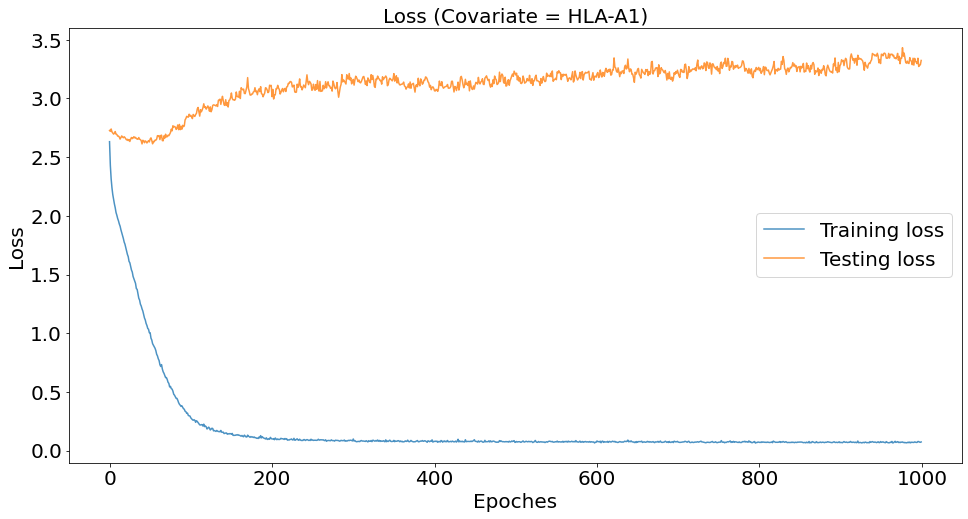

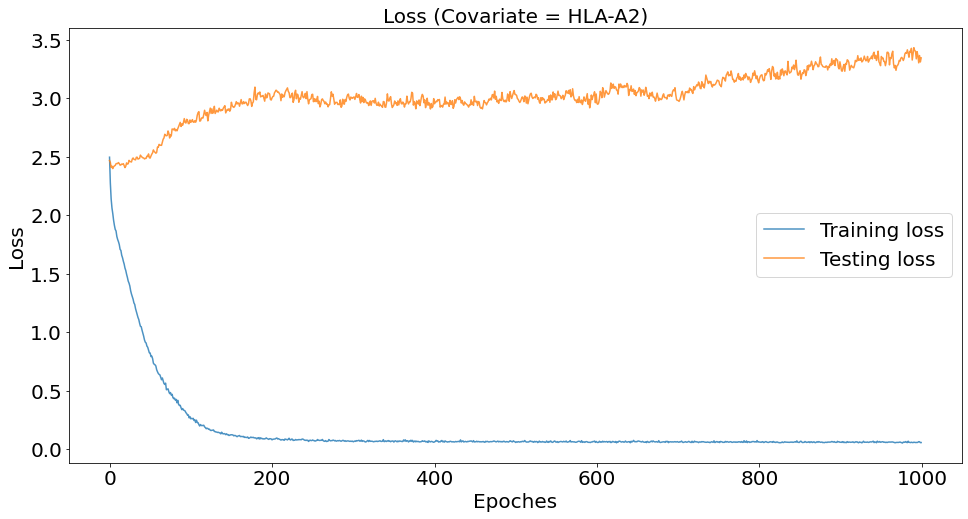

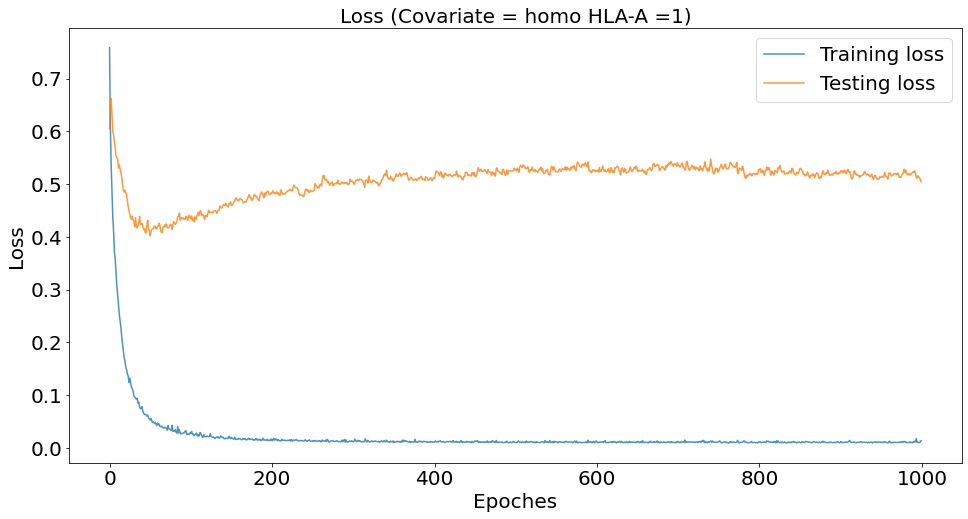

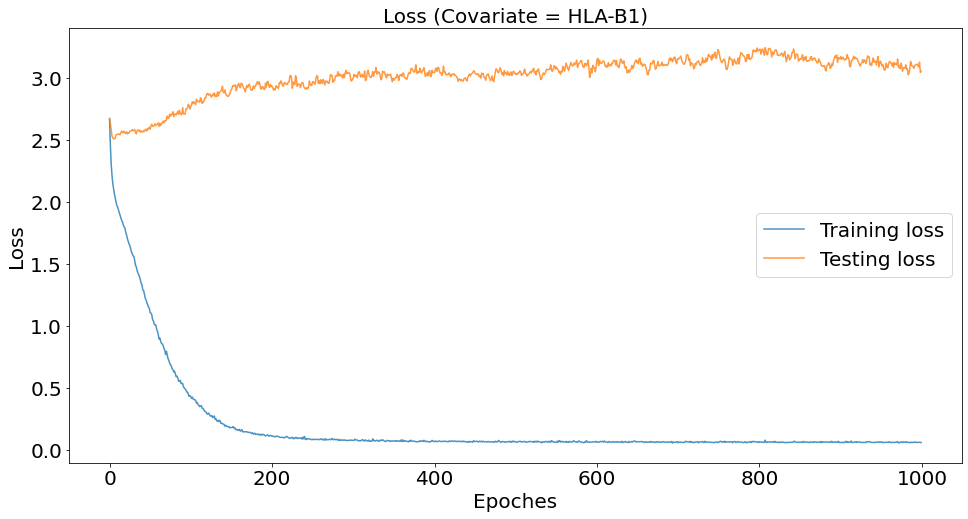

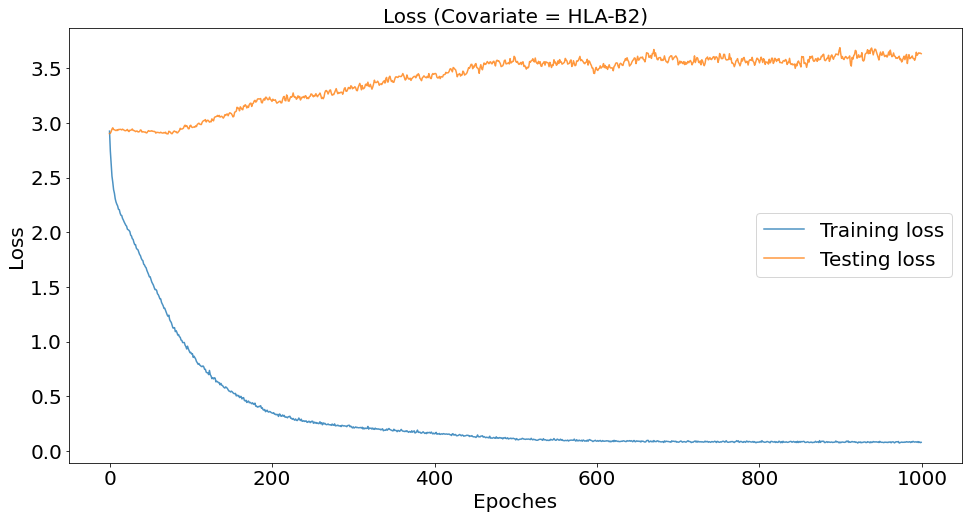

...

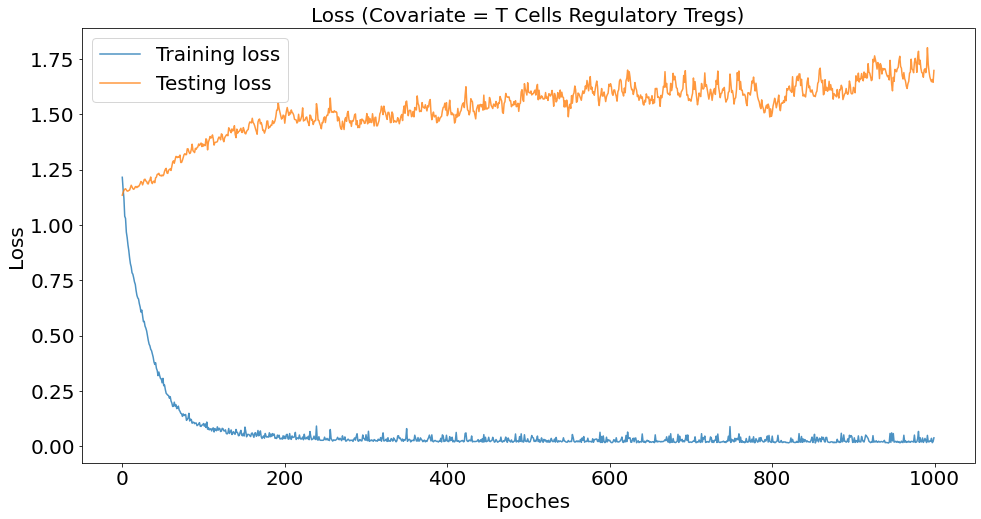

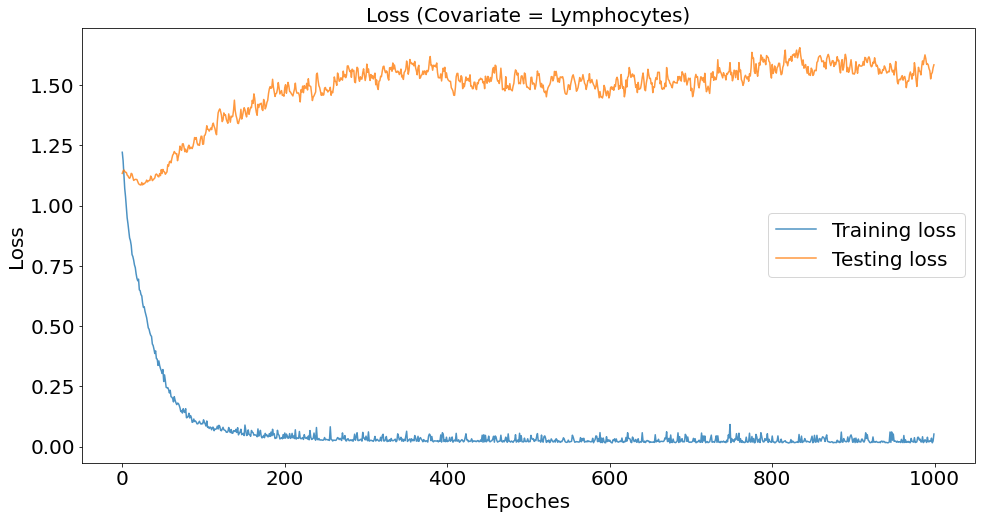

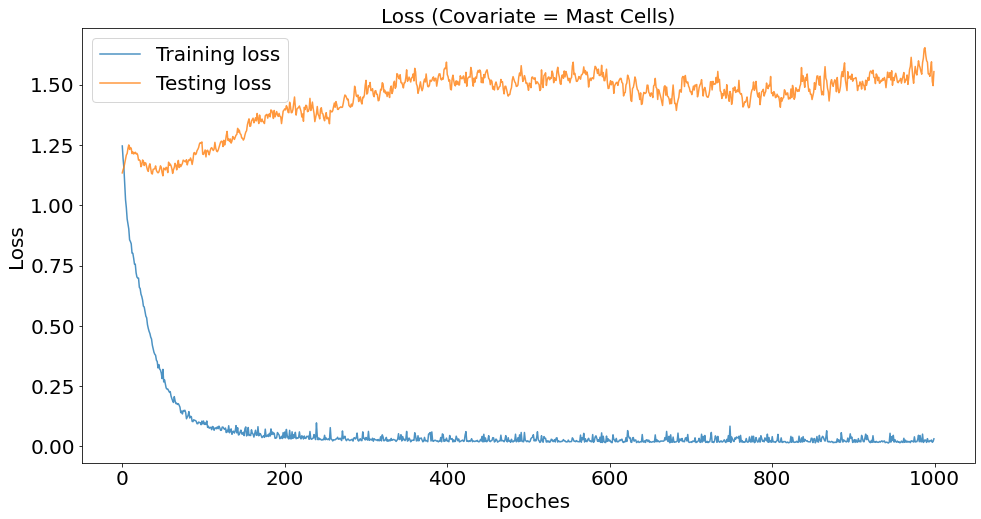

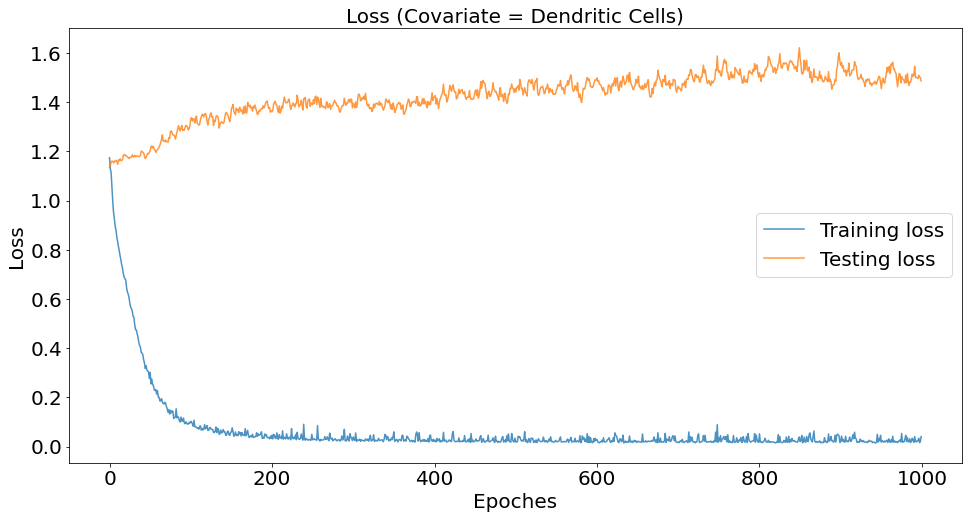

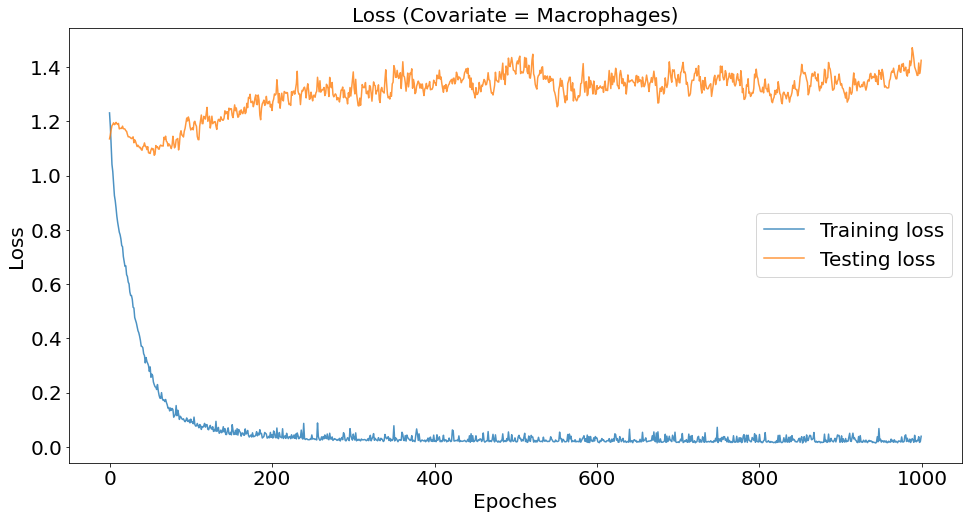

CPU times: user 41min 7s, sys: 3min 12s, total: 44min 20s
Wall time: 41min 10s


In [27]:
%%time
COAD_prediction_result_dict = train_mlp_all_cols('COAD', device=device, dropout_rate=0., weight_decay=0.01)

In [28]:
COAD_prediction_result_dict['auc']

{'HLA-A1': (0.6362568837058633, 0.4690072579095825),
 'HLA-A2': (0.5502911344853493, 0.4131944051885601),
 'homo HLA-A =1': (0.8800000000000001, 0.5189393939393939),
 'HLA-B1': (0.5828894097592159, 0.5352184539491042),
 'HLA-B2': (0.5437510184129053, 0.5148508707332237),
 'homo HLA-B =1': (0.9244, 0.532608695652174),
 'HLA-C1': (0.46970699432892254, 0.42226965777202585),
 'HLA-C2': (0.5734930528954975, 0.5354469149445695),
 'homo HLA-C =1': (0.8555999999999999, 0.3901515151515152),
 'Homozygous in at least one locus = 1': (0.7056, 0.49184149184149184),
 'Homozygous in all three loci = 1': (0.99, 0.7551020408163265),
 'Immune Subtype': (0.8784722222222221, 0.6269021739130435),
 'Leukocyte Fraction': (0.6164000000000001, 0.6116221033868092),
 'TIL Regional Fraction': (0.5158024691358025, 0.5),
 'Macrophage Regulation': (0.5946, 0.5941889483065953),
 'Lymphocyte Infiltration Signature Score': (0.5714, 0.5770053475935828),
 'IFN-gamma Response': (0.5668, 0.5712121212121213),
 'TGF-beta Res

In [29]:
len(list(COAD_prediction_result_dict['auc'].keys()))

54

In [30]:
np.sort([x[0] for x in COAD_prediction_result_dict['auc'].values()])[::-1]

array([0.99      , 0.972     , 0.9244    , 0.88      , 0.87847222,
       0.8556    , 0.8072    , 0.718     , 0.7056    , 0.6992    ,
       0.6824    , 0.6792    , 0.656     , 0.6466    , 0.63625688,
       0.626     , 0.6248    , 0.6164    , 0.6034    , 0.60199653,
       0.6002    , 0.5946    , 0.5894    , 0.58288941, 0.5802    ,
       0.578     , 0.57349305, 0.5714    , 0.5668    , 0.5628    ,
       0.5618    , 0.5508    , 0.55029113, 0.54375102, 0.5436    ,
       0.53055706, 0.51999167, 0.51580247, 0.5036    , 0.5016    ,
       0.48831264, 0.4854    , 0.47772096, 0.46970699, 0.46539792,
       0.4648    , 0.4622    , 0.4568    , 0.4536    , 0.4404708 ,
       0.4386    , 0.4294    , 0.3856    , 0.384     ])

In [31]:
np.sort([x[1] for x in COAD_prediction_result_dict['auc'].values()])[::-1]

array([0.78723404, 0.75510204, 0.6944    , 0.65235294, 0.65081996,
       0.64      , 0.63101604, 0.62690217, 0.61805556, 0.61242424,
       0.6116221 , 0.60458111, 0.6029878 , 0.59559715, 0.59418895,
       0.59388592, 0.58379545, 0.58153298, 0.57700535, 0.57121212,
       0.56643357, 0.56641711, 0.56327986, 0.56247772, 0.55372549,
       0.54960317, 0.53544691, 0.53521845, 0.5326087 , 0.52380952,
       0.51893939, 0.51762523, 0.51485087, 0.50065954, 0.5       ,
       0.49184149, 0.48976046, 0.48579323, 0.47481982, 0.47409982,
       0.47020934, 0.46901883, 0.46900726, 0.46894831, 0.45540107,
       0.45224599, 0.43773619, 0.43726407, 0.42620321, 0.42226966,
       0.41319441, 0.39015152, 0.38846702, 0.35166667])

### STAD

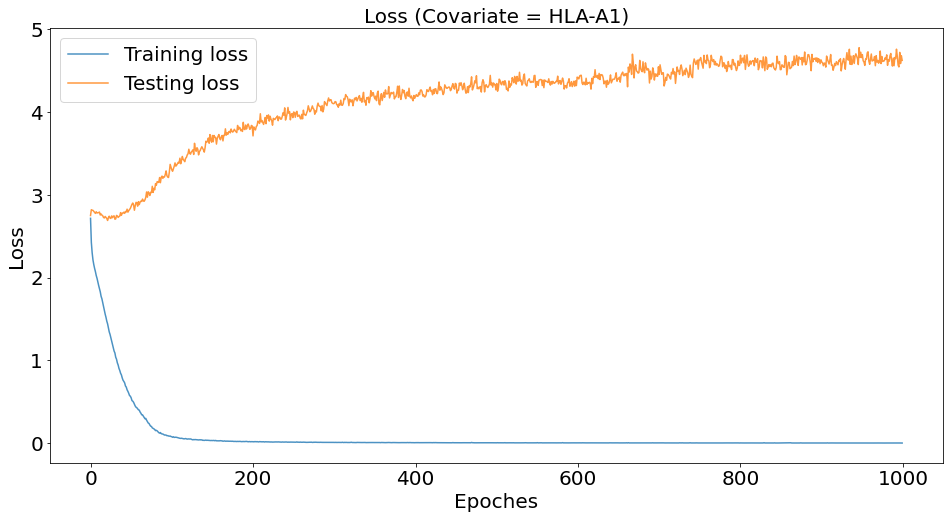

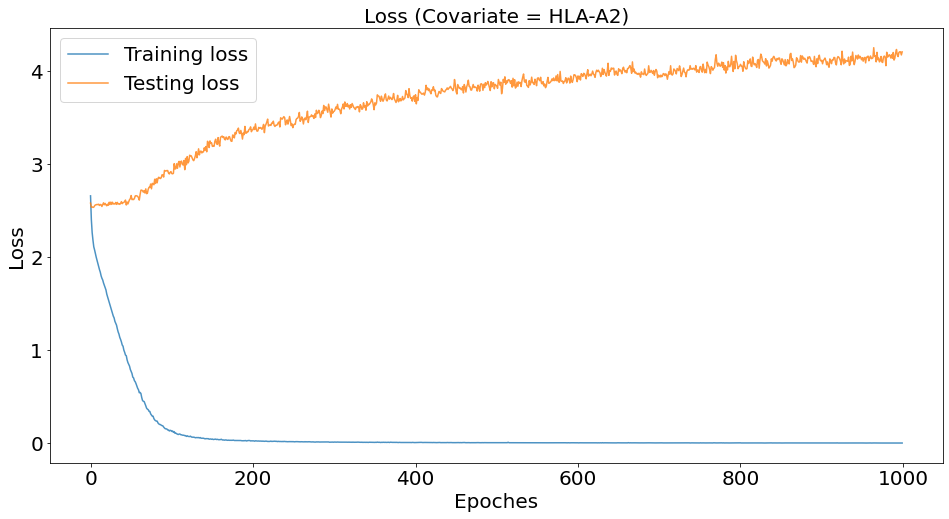

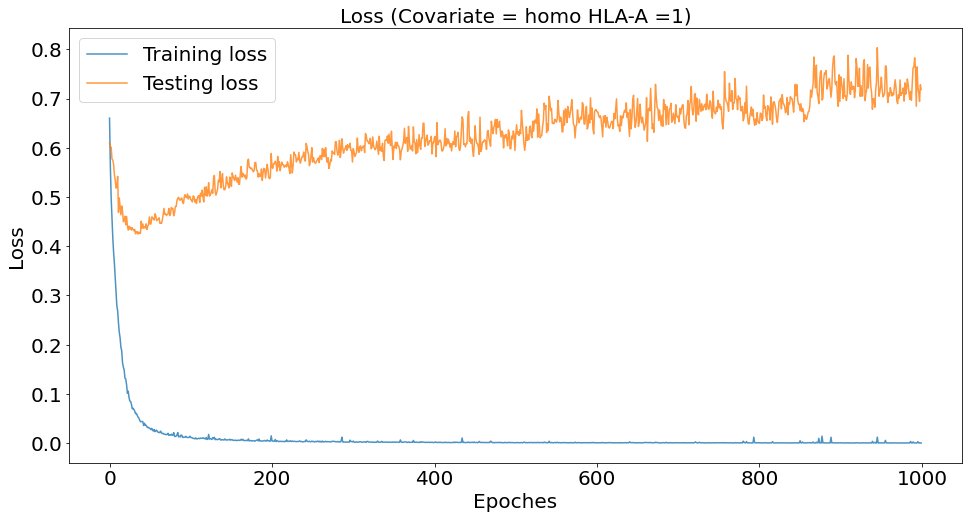

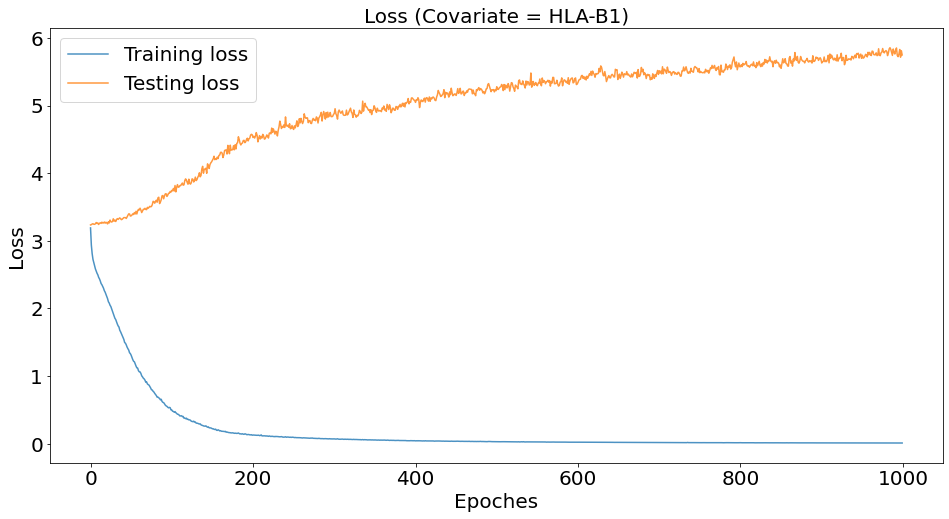

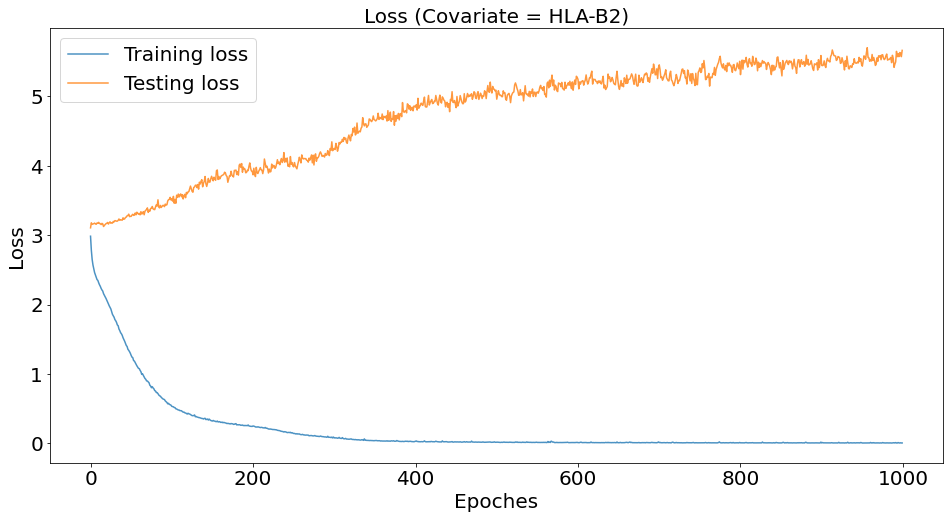

...

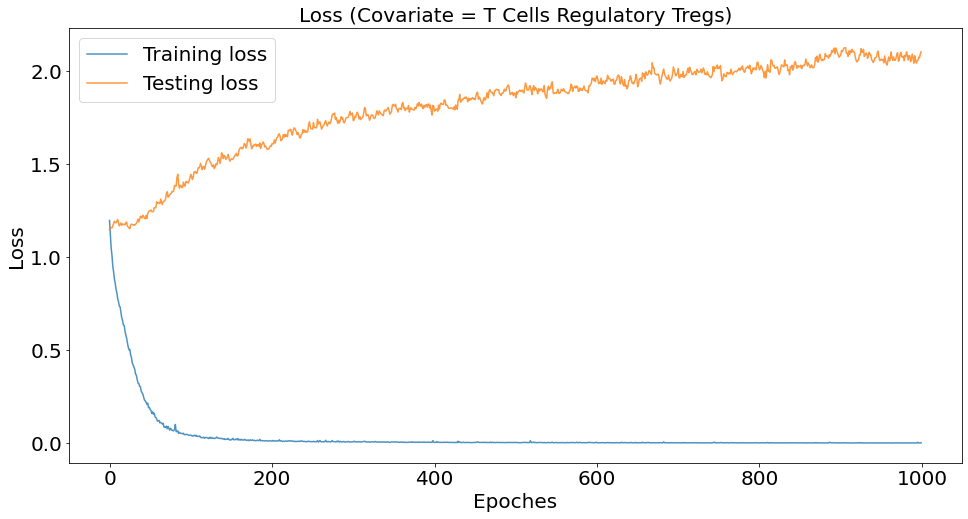

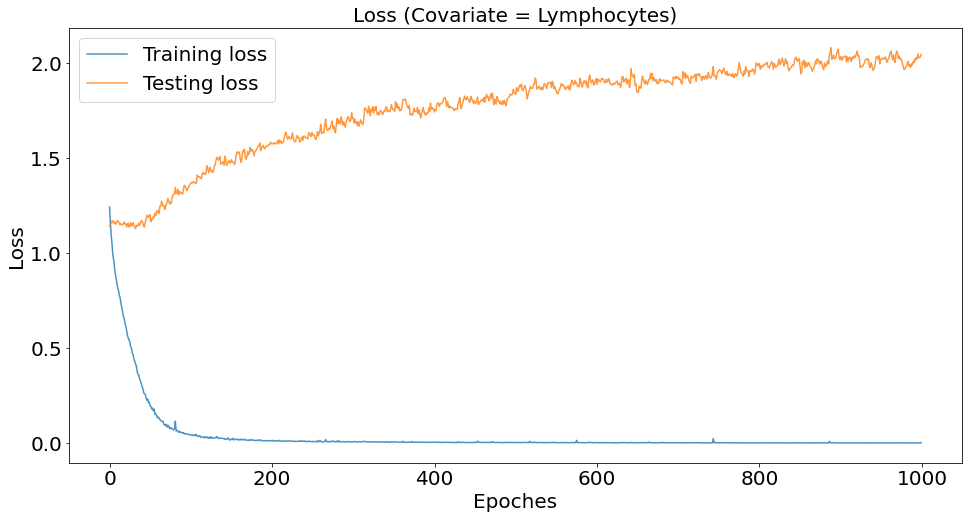

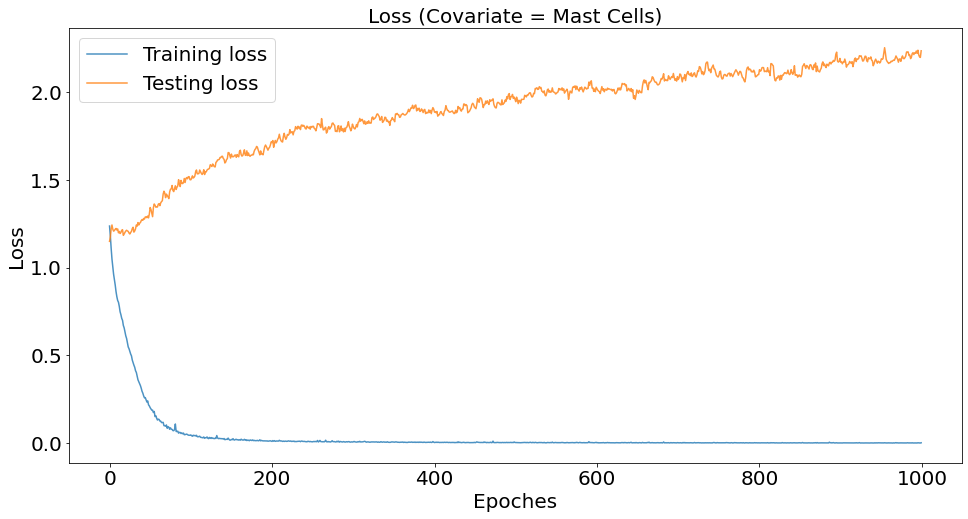

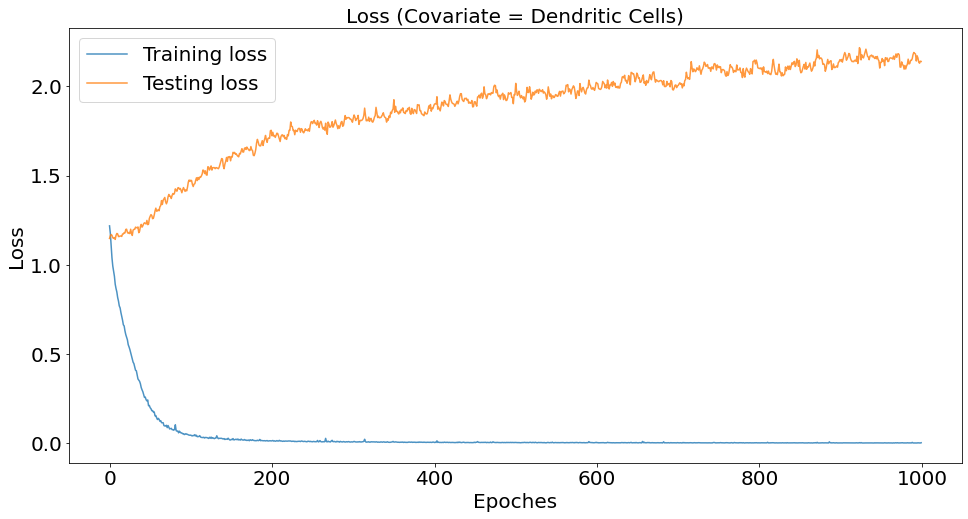

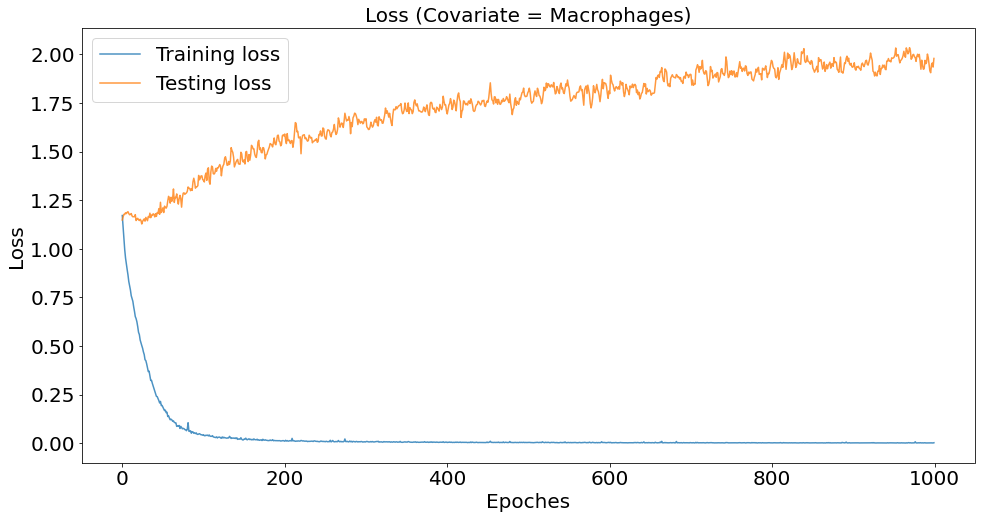

CPU times: user 57min 51s, sys: 3min 6s, total: 1h 58s
Wall time: 58min 12s


In [32]:
%%time
STAD_prediction_result_dict = train_mlp_all_cols('STAD', device=device, dropout_rate=0., weight_decay=0.)

In [33]:
STAD_prediction_result_dict['auc']

{'HLA-A1': (0.6127018454440599, 0.5202555049062132),
 'HLA-A2': (0.6285848157303733, 0.556735821127229),
 'homo HLA-A =1': (0.8843490304709142, 0.6195804195804197),
 'HLA-B1': (0.5419718424479166, 0.532710133423419),
 'HLA-B2': (0.5042222222222223, 0.49036751620634045),
 'homo HLA-B =1': (0.9392313019390581, 0.5408450704225353),
 'HLA-C1': (0.6189882220480611, 0.5331122585859863),
 'HLA-C2': (0.5442174171791312, 0.5104416306460091),
 'homo HLA-C =1': (0.9272853185595568, 0.6190476190476191),
 'Homozygous in at least one locus = 1': (0.7551939058171746,
  0.45164506480558325),
 'Homozygous in all three loci = 1': (0.9974030470914127, 0.9066666666666666),
 'Immune Subtype': (0.7799515235457064, 0.5476362659604013),
 'Leukocyte Fraction': (0.5037222991689752, 0.502280701754386),
 'TIL Regional Fraction': (0.5596093076702097, 0.5866253802694481),
 'Macrophage Regulation': (0.4951523545706371, 0.4943034055727555),
 'Lymphocyte Infiltration Signature Score': (0.5488227146814404,
  0.55270381

In [34]:
len(list(STAD_prediction_result_dict['auc'].keys()))

52

In [35]:
np.sort([x[0] for x in STAD_prediction_result_dict['auc'].values()])[::-1]

array([0.99740305, 0.98978532, 0.95221607, 0.9392313 , 0.92728532,
       0.88434903, 0.77995152, 0.75519391, 0.63010734, 0.62858482,
       0.61898822, 0.61270185, 0.60794668, 0.60647507, 0.60301247,
       0.60272096, 0.60231994, 0.57790859, 0.57695637, 0.57669668,
       0.56942521, 0.56812673, 0.55960931, 0.55947022, 0.55747922,
       0.55401662, 0.55315097, 0.55289127, 0.54882271, 0.54501385,
       0.54421742, 0.54197184, 0.53938712, 0.53808864, 0.53782895,
       0.53704986, 0.53601108, 0.53047091, 0.52711833, 0.52129501,
       0.52103532, 0.51843837, 0.51506233, 0.51210358, 0.50422222,
       0.5037223 , 0.49515235, 0.49298823, 0.48597645, 0.47602147,
       0.47567521, 0.44684903])

In [36]:
np.sort([x[1] for x in STAD_prediction_result_dict['auc'].values()])[::-1]

array([0.90666667, 0.80882353, 0.63410733, 0.61958042, 0.61904762,
       0.61867905, 0.61333333, 0.60594943, 0.60460011, 0.60132095,
       0.59446023, 0.58662538, 0.57505676, 0.57487616, 0.57427245,
       0.56855956, 0.56088751, 0.55930341, 0.55922085, 0.55673582,
       0.55270382, 0.55084623, 0.54829545, 0.54763627, 0.54606295,
       0.54580495, 0.54084507, 0.5379773 , 0.53628483, 0.53311226,
       0.53271013, 0.53254848, 0.53185596, 0.53139835, 0.52854123,
       0.52152219, 0.5202555 , 0.51928847, 0.51916376, 0.5176677 ,
       0.5154128 , 0.51392578, 0.51044163, 0.5022807 , 0.49430341,
       0.49251806, 0.49036752, 0.48793086, 0.48540248, 0.46830237,
       0.45706371, 0.45164506])

### LUAD

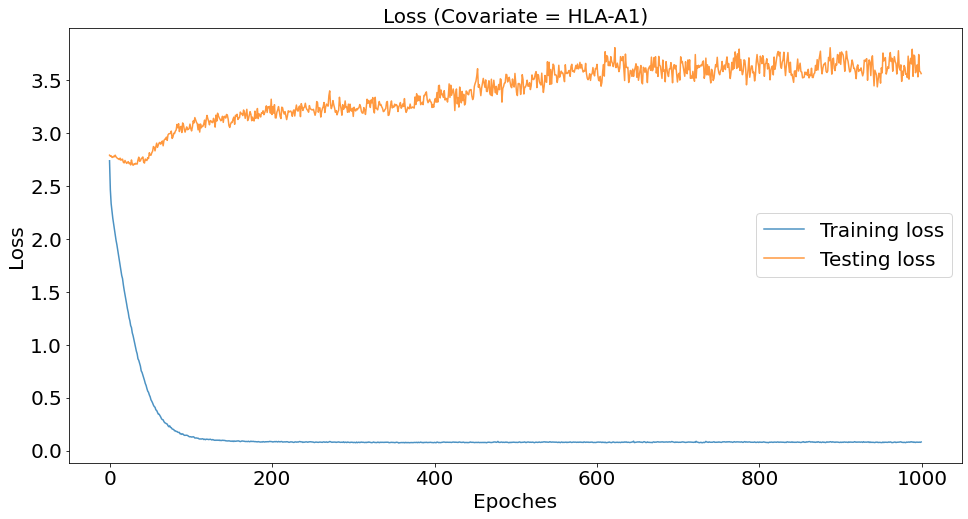

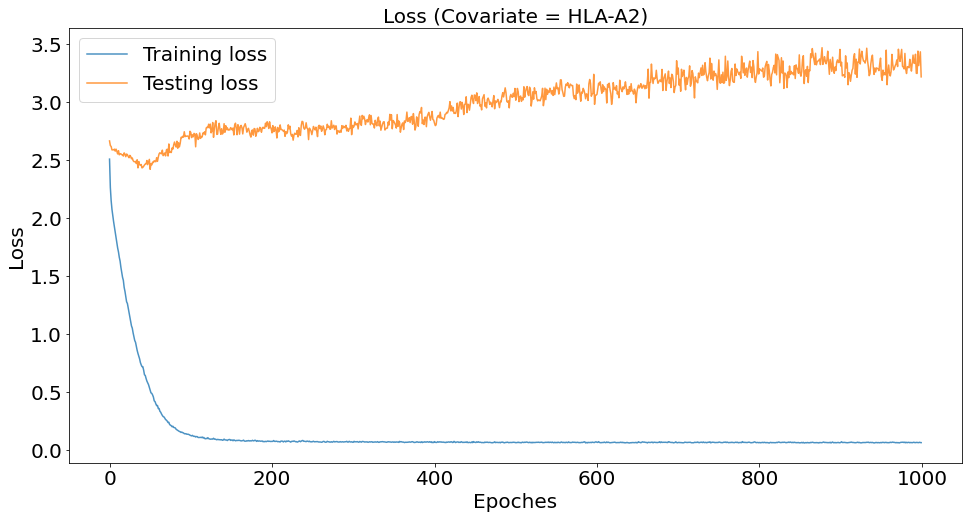

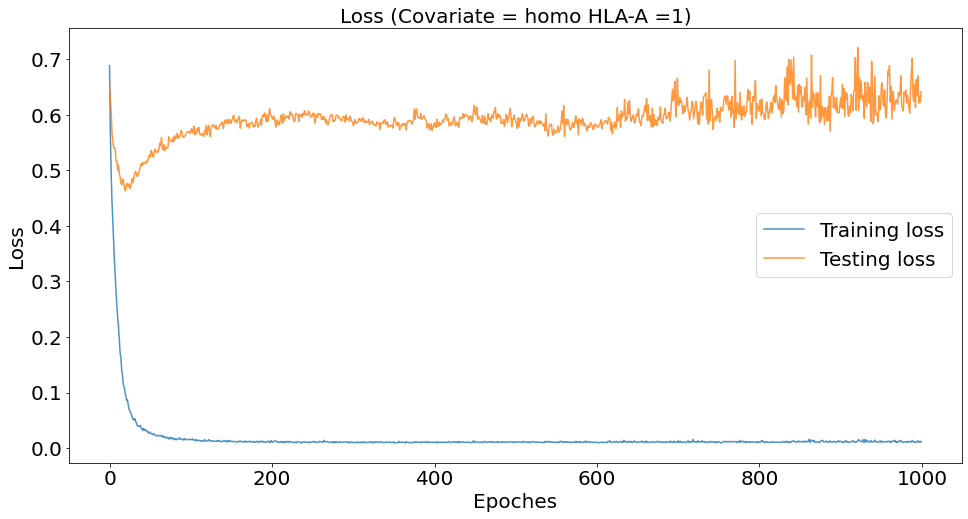

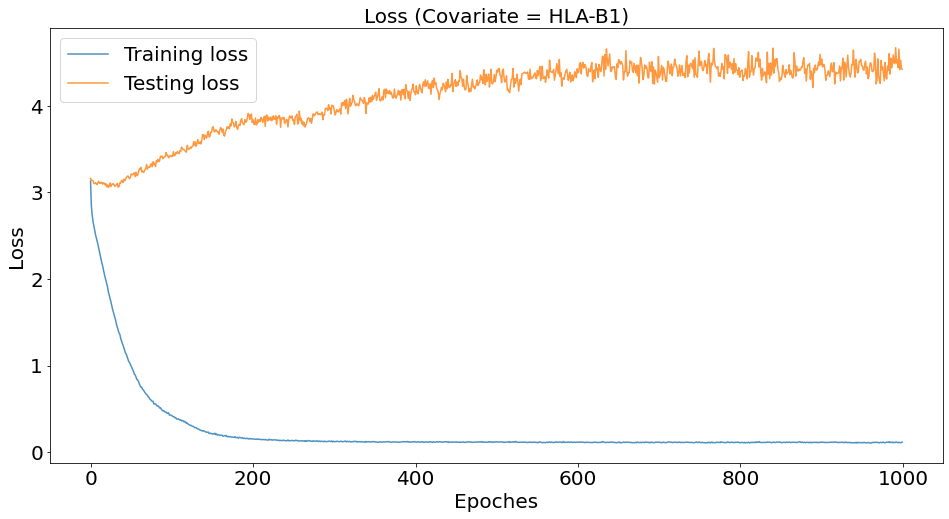

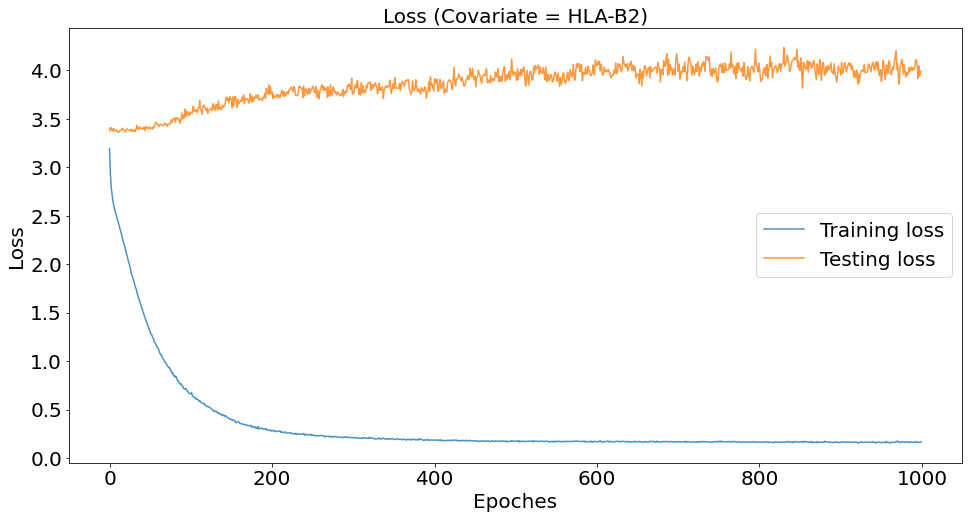

...

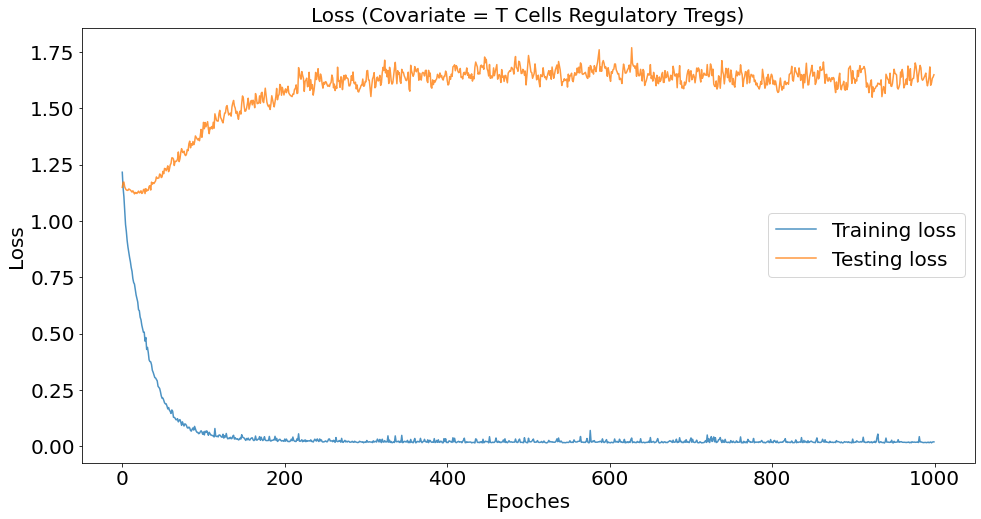

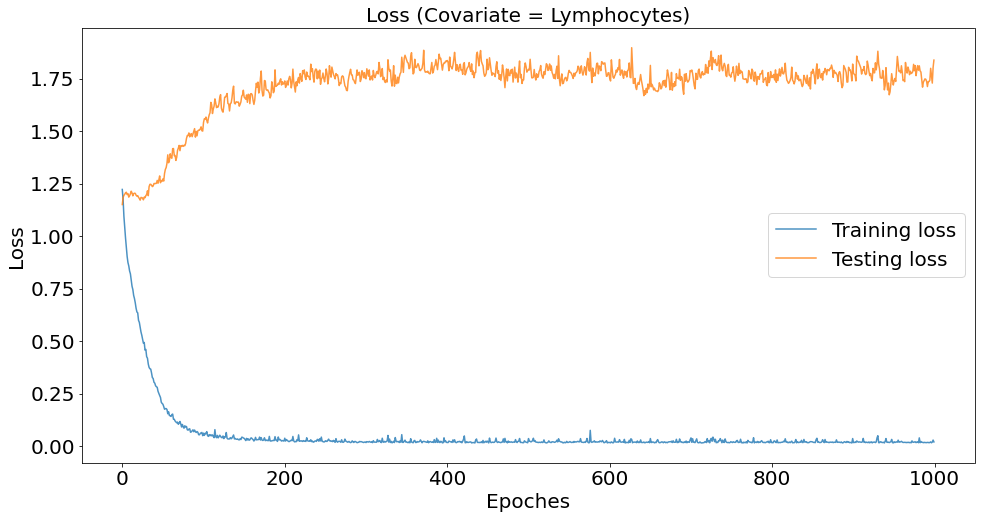

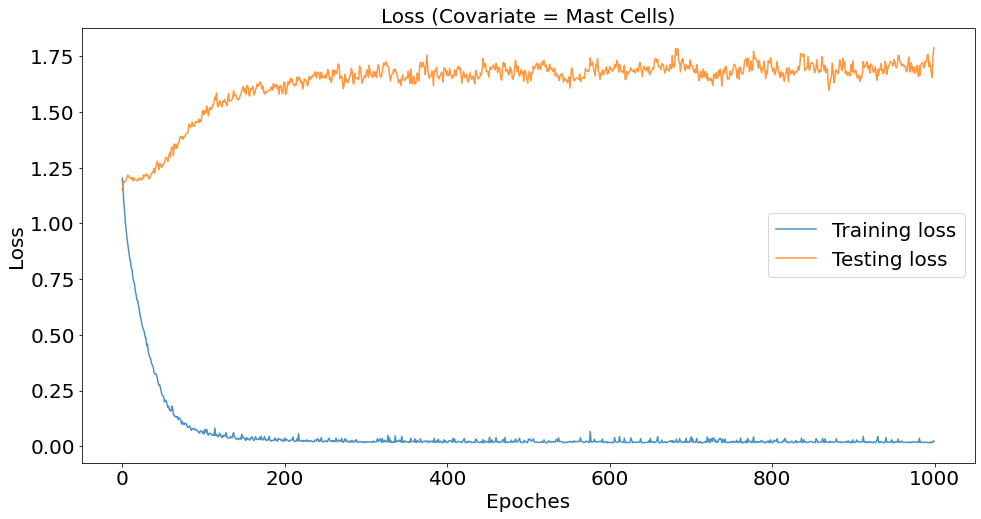

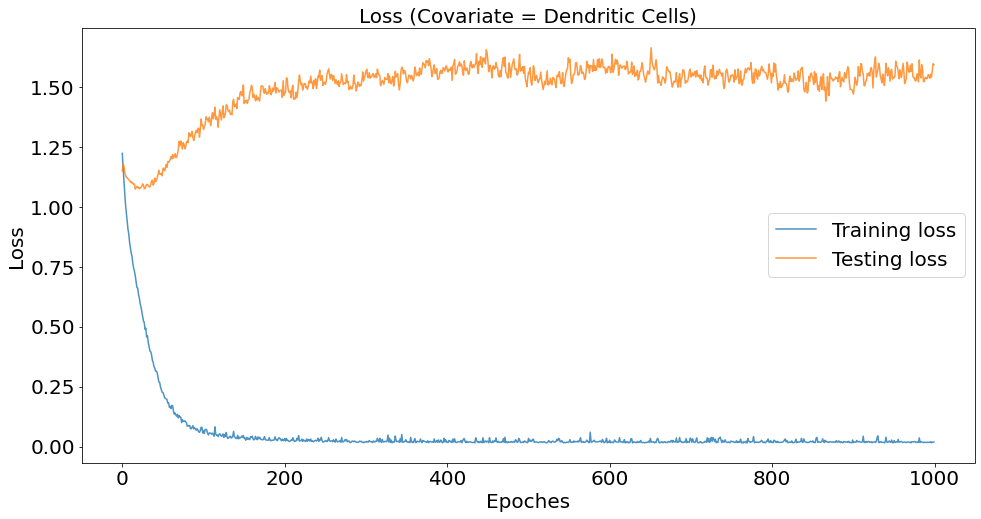

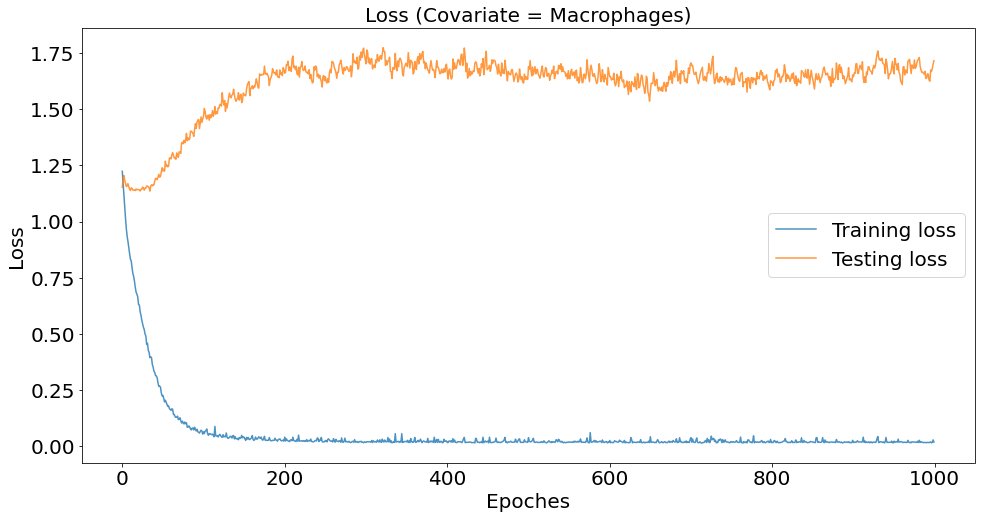

CPU times: user 1h 16min 19s, sys: 3min 41s, total: 1h 20min
Wall time: 1h 16min 56s


In [37]:
%%time
LUAD_prediction_result_dict = train_mlp_all_cols('LUAD', device=device, dropout_rate=0., weight_decay=0.01)

In [38]:
LUAD_prediction_result_dict['auc']

{'HLA-A1': (0.6484764542936288, 0.5776346900656775),
 'HLA-A2': (0.622829861111111, 0.5292943345399311),
 'homo HLA-A =1': (0.8656994412312519, 0.5236013986013985),
 'HLA-B1': (0.5657251152432802, 0.4753273685051927),
 'HLA-B2': (0.5882844261965141, 0.5875930898560254),
 'homo HLA-B =1': (0.9253014410351926, 0.5376344086021505),
 'HLA-C1': (0.6213691907051282, 0.5364747913269046),
 'HLA-C2': (0.4929820907955018, 0.47048690027435314),
 'homo HLA-C =1': (0.891775316145476, 0.4560439560439561),
 'Homozygous in at least one locus = 1': (0.7591412606607195,
  0.6187290969899666),
 'Homozygous in all three loci = 1': (0.9901970395059307, 0.7575757575757576),
 'Immune Subtype': (0.6495061728395062, 0.5645823294317385),
 'Leukocyte Fraction': (0.5266150377413981, 0.5228031363276802),
 'TIL Regional Fraction': (0.5421195652173915, 0.5450762191617042),
 'Macrophage Regulation': (0.42901234567901236, 0.4244444444444444),
 'Lymphocyte Infiltration Signature Score': (0.44870370370370366,
  0.450370

In [39]:
len(list(LUAD_prediction_result_dict['auc'].keys()))

54

In [40]:
np.sort([x[0] for x in LUAD_prediction_result_dict['auc'].values()])[::-1]

array([0.99019704, 0.96654321, 0.96555556, 0.92530144, 0.89177532,
       0.86569944, 0.75914126, 0.75037037, 0.72074074, 0.68135802,
       0.64950617, 0.64847645, 0.62282986, 0.62136919, 0.60592593,
       0.58828443, 0.5862963 , 0.57771605, 0.56987654, 0.56572512,
       0.5645679 , 0.5641358 , 0.55437981, 0.55234568, 0.54645767,
       0.54401235, 0.54211957, 0.54030864, 0.53604938, 0.52661504,
       0.52196692, 0.52148148, 0.51913989, 0.51790123, 0.5158642 ,
       0.51067901, 0.50833333, 0.50706981, 0.5063    , 0.5045679 ,
       0.50160494, 0.5004321 , 0.49722222, 0.49716049, 0.49419753,
       0.49298209, 0.4887037 , 0.48456469, 0.47697531, 0.47450617,
       0.46993827, 0.4554321 , 0.4487037 , 0.42901235])

In [41]:
np.sort([x[1] for x in LUAD_prediction_result_dict['auc'].values()])[::-1]

array([0.75757576, 0.63896104, 0.63372093, 0.61918605, 0.6187291 ,
       0.6010101 , 0.58759309, 0.58574074, 0.57763469, 0.57592593,
       0.57331731, 0.56740741, 0.56574074, 0.56458233, 0.55957828,
       0.5587037 , 0.55555556, 0.54606933, 0.54507622, 0.5437037 ,
       0.54277778, 0.5394479 , 0.53763441, 0.53647479, 0.53071121,
       0.52929433, 0.52574074, 0.5236014 , 0.52280314, 0.52270679,
       0.51989975, 0.51901235, 0.50722222, 0.50555556, 0.50518519,
       0.50518519, 0.504109  , 0.50407407, 0.50313591, 0.50055556,
       0.49814815, 0.49574074, 0.49555556, 0.48647242, 0.4812963 ,
       0.47532737, 0.47444444, 0.47092593, 0.4704869 , 0.47018519,
       0.45604396, 0.45580247, 0.45037037, 0.42444444])

### LUSC

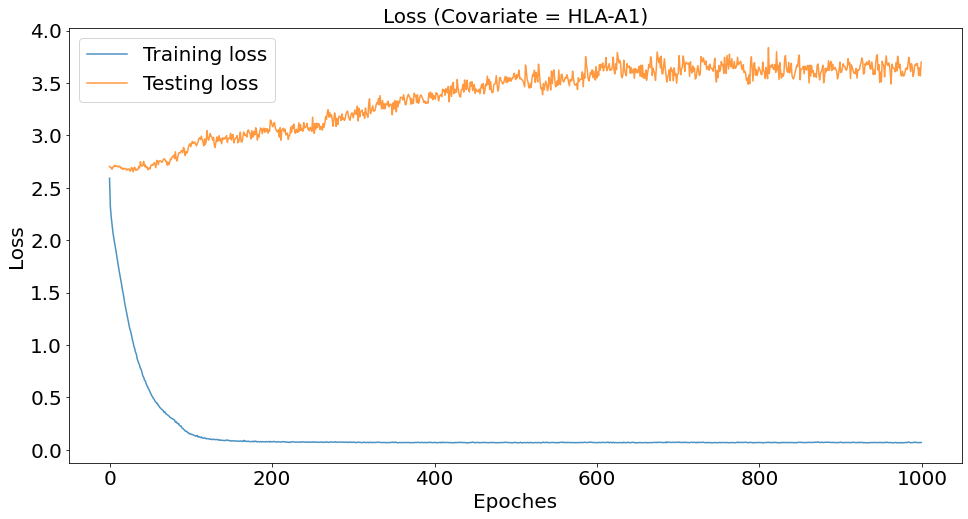

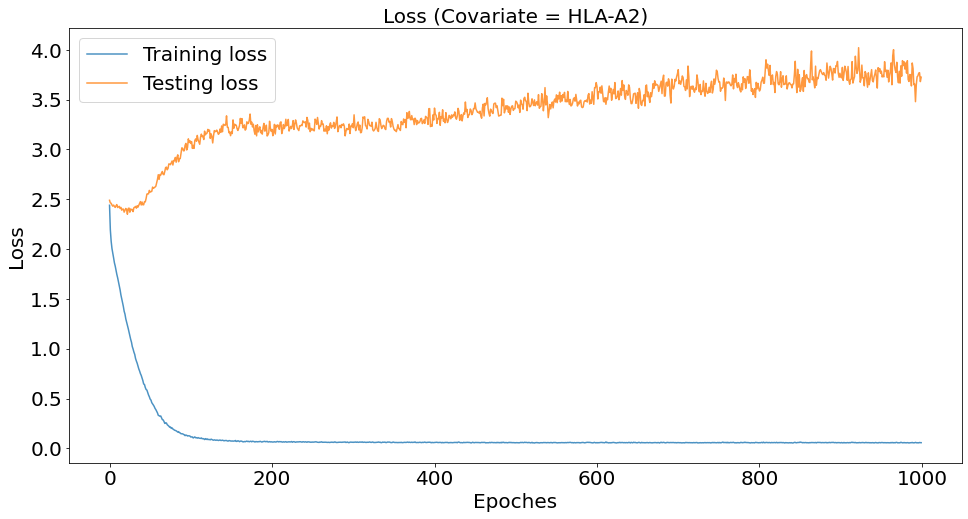

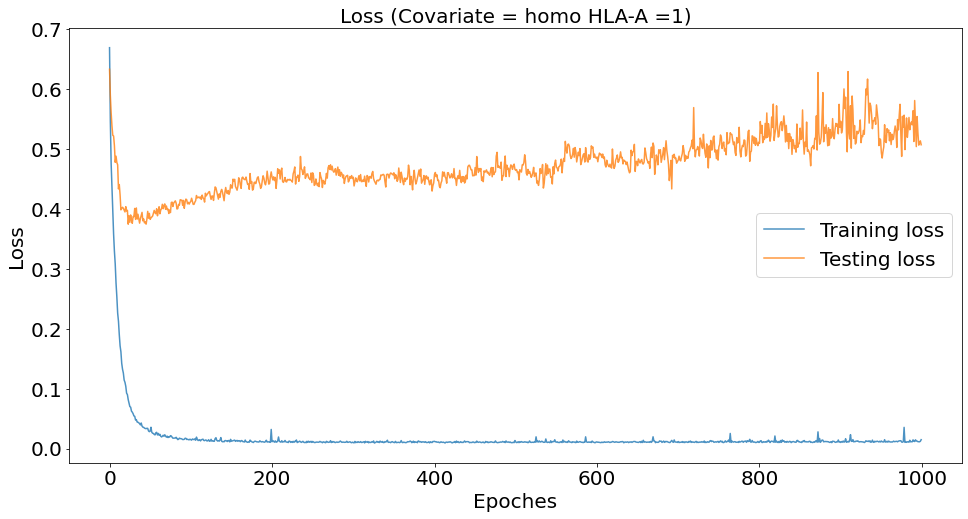

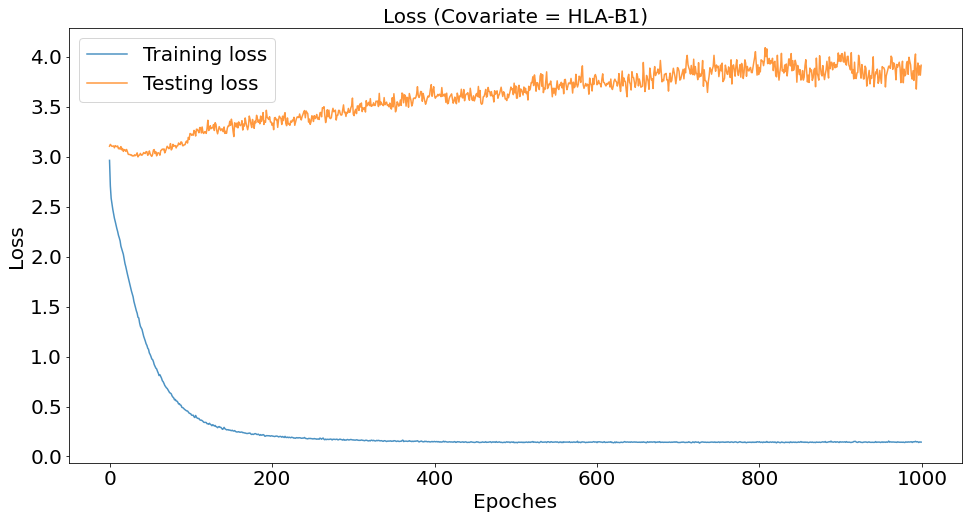

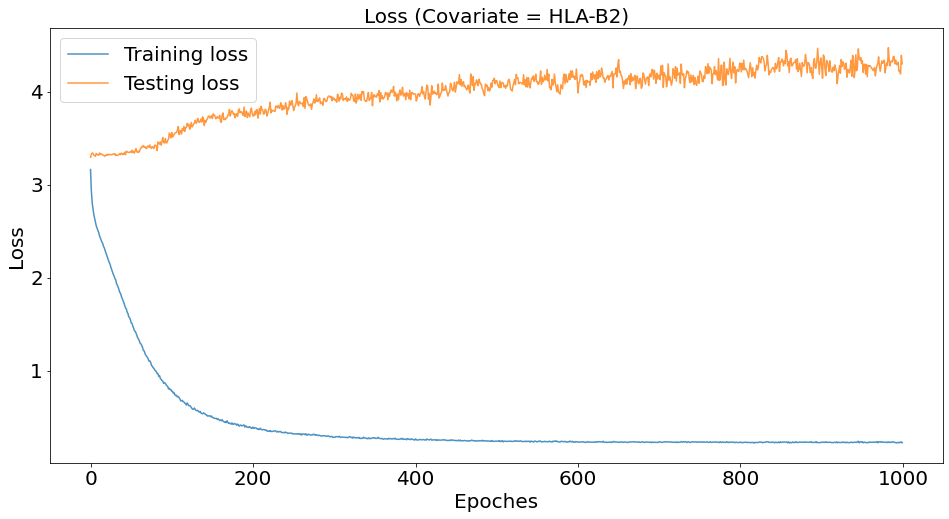

...

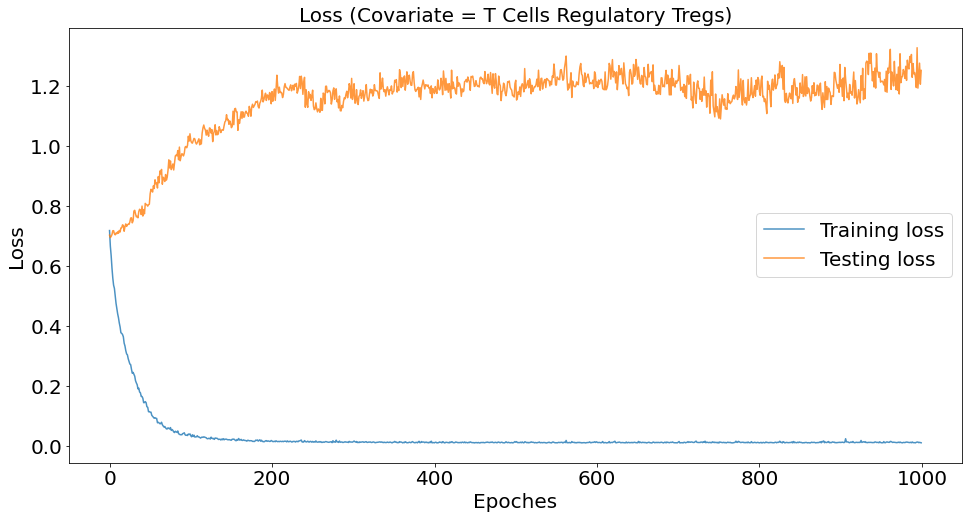

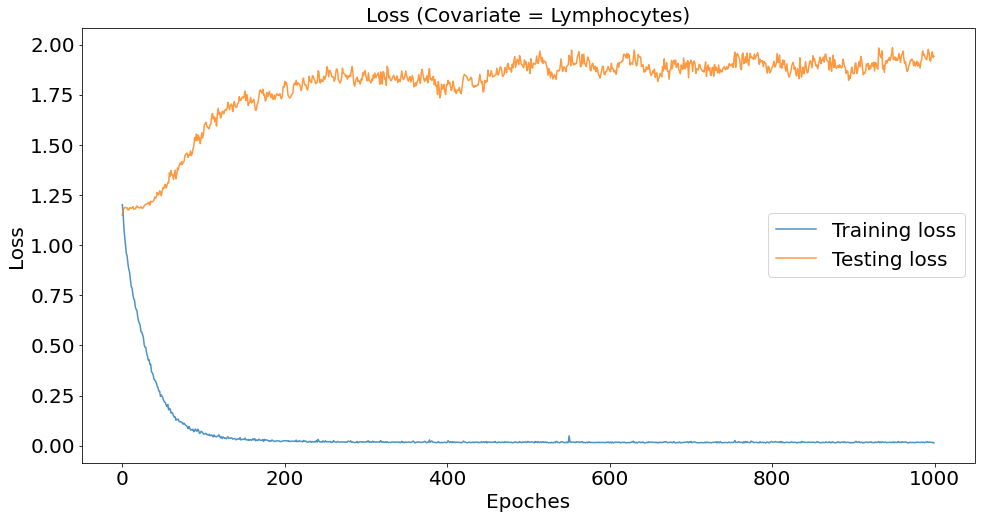

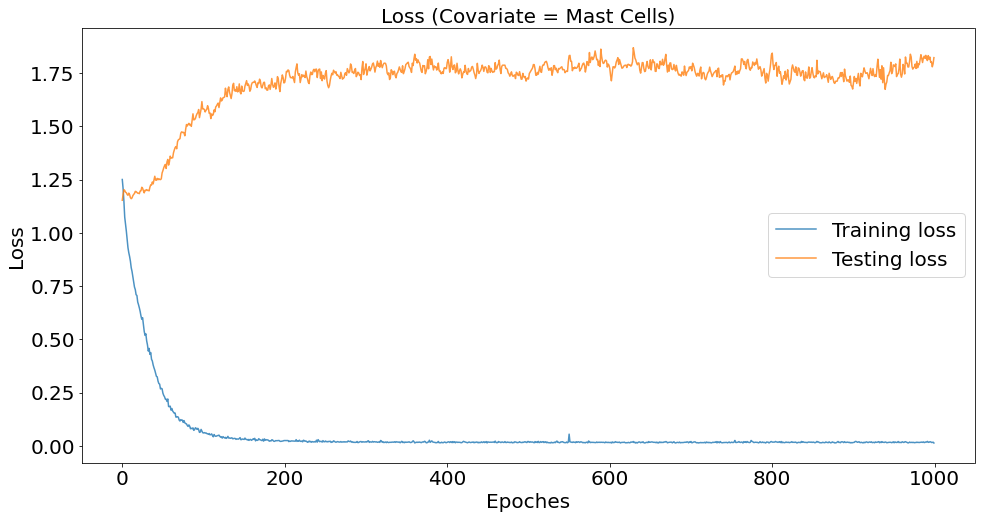

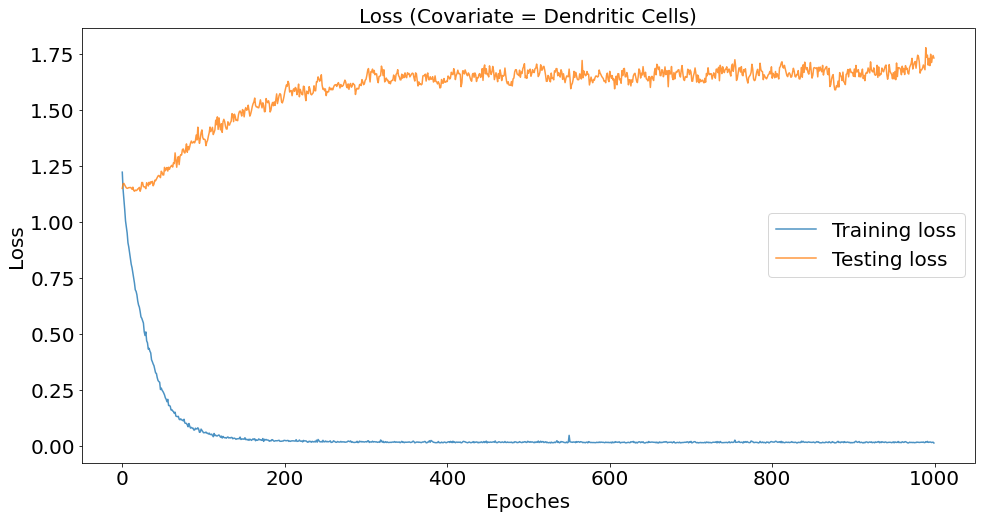

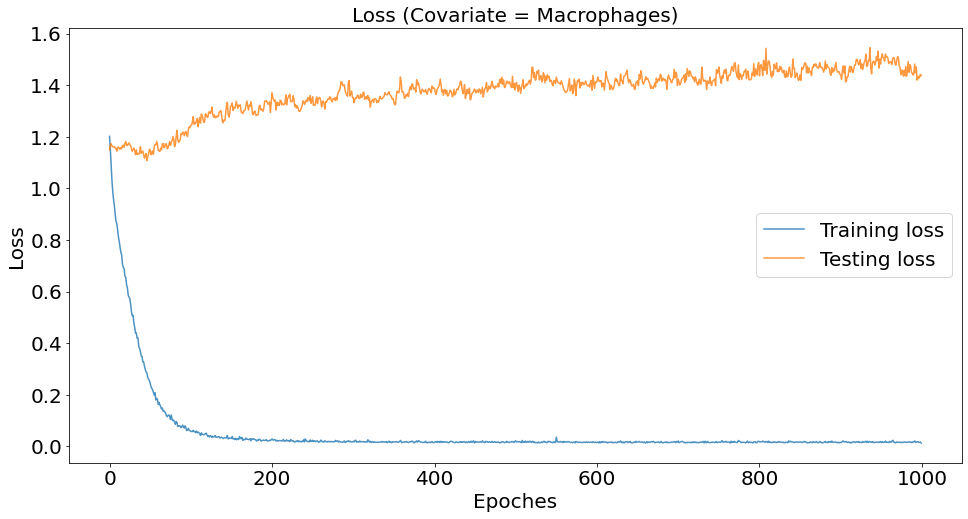

CPU times: user 57min 30s, sys: 3min 45s, total: 1h 1min 16s
Wall time: 57min 52s


In [42]:
%%time
LUSC_prediction_result_dict = train_mlp_all_cols('LUSC', device=device, dropout_rate=0., weight_decay=0.01)

In [43]:
LUSC_prediction_result_dict['auc']

{'HLA-A1': (0.5648243801652892, 0.5129979328943197),
 'HLA-A2': (0.5088889143932699, 0.429550729332174),
 'homo HLA-A =1': (0.8925887385824951, 0.5643015521064302),
 'HLA-B1': (0.5882130933372043, 0.5182356452059386),
 'HLA-B2': (0.5251473689903197, 0.513306763904846),
 'homo HLA-B =1': (0.9377962770262459, 0.5980066445182725),
 'HLA-C1': (0.5362108298898072, 0.4730974160289515),
 'HLA-C2': (0.5448338081671416, 0.5248591005983673),
 'homo HLA-C =1': (0.9070412764481443, 0.6646090534979423),
 'Homozygous in at least one locus = 1': (0.707943114810961,
  0.4722222222222222),
 'Homozygous in all three loci = 1': (0.9646201873048906, 0.4592592592592592),
 'Immune Subtype': (0.7597699155971789, 0.5986949625545651),
 'Leukocyte Fraction': (0.5400046248121171, 0.537287547693375),
 'TIL Regional Fraction': (0.5592585829072315, 0.5655102040816328),
 'Macrophage Regulation': (0.580471730835935, 0.5808185917447104),
 'Lymphocyte Infiltration Signature Score': (0.5519713261648745,
  0.554457162677

In [44]:
len(list(LUSC_prediction_result_dict['auc'].keys()))

55

In [45]:
np.sort([x[0] for x in LUSC_prediction_result_dict['auc'].values()])[::-1]

array([0.98924731, 0.96462019, 0.94693028, 0.93779628, 0.90704128,
       0.89258874, 0.89154816, 0.75976992, 0.70794311, 0.66302463,
       0.62117008, 0.60770031, 0.59440398, 0.58821309, 0.58781362,
       0.58047173, 0.56700197, 0.56601919, 0.56482438, 0.55925858,
       0.55707491, 0.55197133, 0.54962963, 0.54961025, 0.54483381,
       0.54382009, 0.54295294, 0.54000462, 0.53752147, 0.53647821,
       0.53621083, 0.5267604 , 0.52641924, 0.52514737, 0.52266158,
       0.51844144, 0.51844144, 0.51751648, 0.51560874, 0.51560874,
       0.51208232, 0.51127298, 0.50888891, 0.49219563, 0.478379  ,
       0.47351852, 0.47183916, 0.45837669, 0.44947393, 0.44883802,
       0.44490693, 0.44271014, 0.43542606, 0.4282576 , 0.41906579])

In [46]:
np.sort([x[1] for x in LUSC_prediction_result_dict['auc'].values()])[::-1]

array([0.84444444, 0.66460905, 0.65845171, 0.61984044, 0.61111111,
       0.60787374, 0.59869496, 0.59800664, 0.5892692 , 0.58723552,
       0.58081859, 0.57308048, 0.56850503, 0.5655102 , 0.56430155,
       0.55445716, 0.55166667, 0.54974237, 0.5469679 , 0.54625347,
       0.54370447, 0.53728755, 0.53686088, 0.53260493, 0.52821462,
       0.52728955, 0.52654163, 0.526188  , 0.5248591 , 0.51823565,
       0.51716961, 0.51647589, 0.51387444, 0.51370101, 0.51330676,
       0.51299793, 0.51127298, 0.48103608, 0.47710718, 0.47309742,
       0.47222222, 0.46583868, 0.46574074, 0.45925926, 0.45872355,
       0.45438779, 0.44831772, 0.44495837, 0.44305556, 0.43444329,
       0.42955073, 0.42039542, 0.41651032, 0.41640652, 0.375     ])